### Figure 1 (A and B)
-----

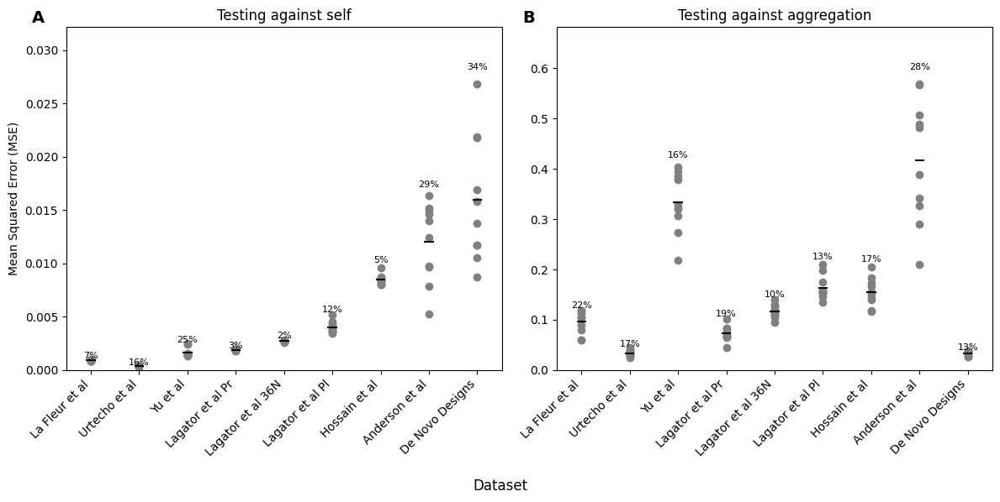

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# -------------------- Data Preprocessing Functions --------------------

def combine_columns(df):
    X = df['Promoter Sequence'].astype(str)
    y = df['Normalized Observed log(TX/Txref)']
    return X, y

def padded_one_hot_encode(seq):
    mapping = {'A': [1,0,0,0], 'C': [0,1,0,0], 'G': [0,0,1,0], 'T': [0,0,0,1], '0': [0,0,0,0]}
    return [mapping[n.upper()] for n in seq]

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

# -------------------- Data Splitting Function --------------------

def split_data_by_file(df):
    file_names = df['File Name'].unique()
    split_data = {name: {} for name in file_names}
    split_data['all'] = {}

    for name in list(file_names) + ['all']:
        subset = df if name == 'all' else df[df['File Name'] == name]
        X, y = combine_columns(subset)
        X = preprocess_sequences(X)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        split_data[name].update({'X_train': X_train, 'X_test': X_test, 'y_train': y_train, 'y_test': y_test})

    return split_data, file_names

# -------------------- Load Evaluation Metrics --------------------

def load_repeat_evaluate(csv_path):
    df = pd.read_csv(csv_path, index_col=0)
    results = {}
    for col in df.columns:
        if ' (Self)' in col:
            key = col.replace(' (Self)', '')
            results[key] = list(zip(df[f'{key} (Self)'], df[f'{key} (All)']))
    return results

# -------------------- Main Execution --------------------

df = pd.read_csv('Data/LaFleur_supp.csv')
split_data, file_names = split_data_by_file(df)
all_results = load_repeat_evaluate('Data/repeat_evalute_each_file.csv')

file_order = [
    'La Fleur et al', 'Urtecho et al', 'Yu et al', 'Lagator et al Pr',
    'Lagator et al 36N', 'Lagator et al Pl', 'Hossain et al',
    'Anderson et al', 'De Novo Designs'
]
file_order = [f for f in file_order if f in file_names]
x = np.arange(len(file_order))

# Calculate averages and coefficient of variation (CV)
avg_results = {f: np.mean(all_results[f], axis=0) for f in file_names}
avg_train = {f: res[0] for f, res in avg_results.items()}
avg_all = {f: res[1] for f, res in avg_results.items()}

cv_train = {f: np.std([r[0] for r in all_results[f]]) / avg_train[f] for f in file_names}
cv_all = {f: np.std([r[1] for r in all_results[f]]) / avg_all[f] for f in file_names}

# Extract MSEs
train_mse = {f: [r[0] for r in all_results[f]] for f in file_order}
all_mse = {f: [r[1] for r in all_results[f]] for f in file_order}
avg_train_list = [avg_train[f] for f in file_order]
avg_all_list = [avg_all[f] for f in file_order]

# -------------------- Plotting --------------------

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

for i, file in enumerate(file_order):
    ax1.scatter([x[i]] * len(train_mse[file]), train_mse[file], color='grey')
    ax1.hlines(avg_train_list[i], x[i] - 0.1, x[i] + 0.1, colors='black')
    ax1.text(x[i], max(train_mse[file]) * 1.05, f'{int(cv_train[file]*100)}%', ha='center', fontsize=8, color='black')

ax1.set_xticks(x, file_order, rotation=45, ha='right')
ax1.set_ylabel('Mean Squared Error (MSE)')
ax1.set_title('Testing against self')
ax1.set_ylim(0, max(map(max, train_mse.values())) * 1.2)

ax1.text(-0.05, 1.05, "A", transform=ax1.transAxes, ha='right', va='top', fontsize=14, fontweight='bold')

for i, file in enumerate(file_order):
    ax2.scatter([x[i]] * len(all_mse[file]), all_mse[file], color='grey')
    ax2.hlines(avg_all_list[i], x[i] - 0.1, x[i] + 0.1, colors='black')
    ax2.text(x[i], max(all_mse[file]) * 1.05, f'{int(cv_all[file]*100)}%', ha='center', fontsize=8)

ax2.set_xticks(x, file_order, rotation=45, ha='right')
ax2.set_title('Testing against aggregation')
ax2.set_ylim(0, max(map(max, all_mse.values())) * 1.2)

ax2.text(-0.05, 1.05, "B", transform=ax2.transAxes, ha='right', va='top', fontsize=14, fontweight='bold', color='black')

fig.supxlabel("Dataset")
plt.tight_layout()
plt.show()

# Save the figure
fig.savefig('Figures/Figure1.pdf', dpi=300, bbox_inches='tight')

### Figure 2
-----

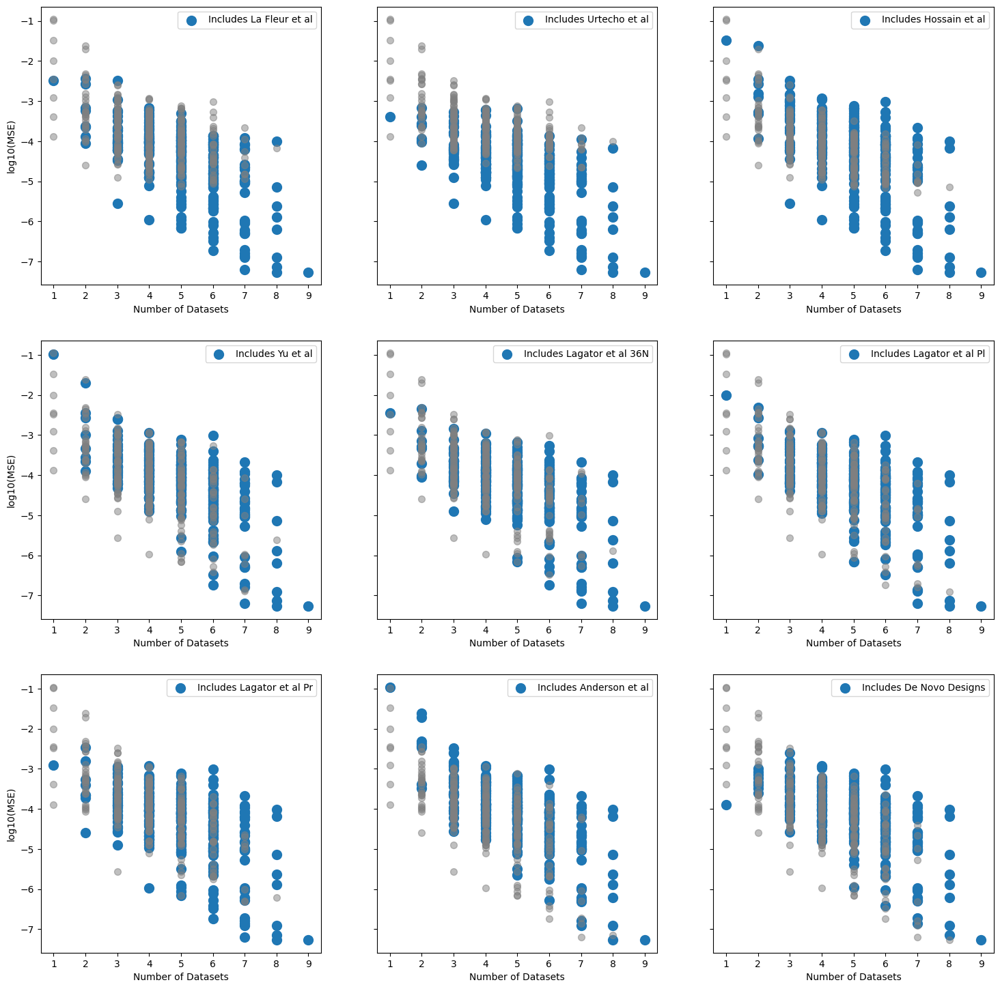

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
file_names = pd.read_csv('Data/LaFleur_supp.csv')['File Name'].unique()
data = pd.read_csv('Data/data_comparison.csv').values

# Set up grid for plots
fig, axs = plt.subplots(3, 3, figsize=(18, 18))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

# Plotting
for i, file_name in enumerate(file_names):
    row, col = divmod(i, 3)
    ax = axs[row, col]

    included = [(n, l) for n, l, combo in data if file_name in combo]
    excluded = [(n, l) for n, l, combo in data if file_name not in combo]

    if included:
        x_incl, y_incl = zip(*included)
        ax.scatter(x_incl, y_incl, color='tab:blue', s=100, label=f'Includes {file_name}')
    
    if excluded:
        x_excl, y_excl = zip(*excluded)
        ax.scatter(x_excl, y_excl, color='grey', s=50, alpha=0.5)

    ax.set_xlabel('Number of Datasets')
    if col == 0:
        ax.set_ylabel('log10(MSE)')
    else:
        ax.set_yticklabels([])

    ax.legend()

plt.show()

# Save the figure
# fig.savefig('Figures/Figure 2.pdf', dpi=300, bbox_inches='tight')


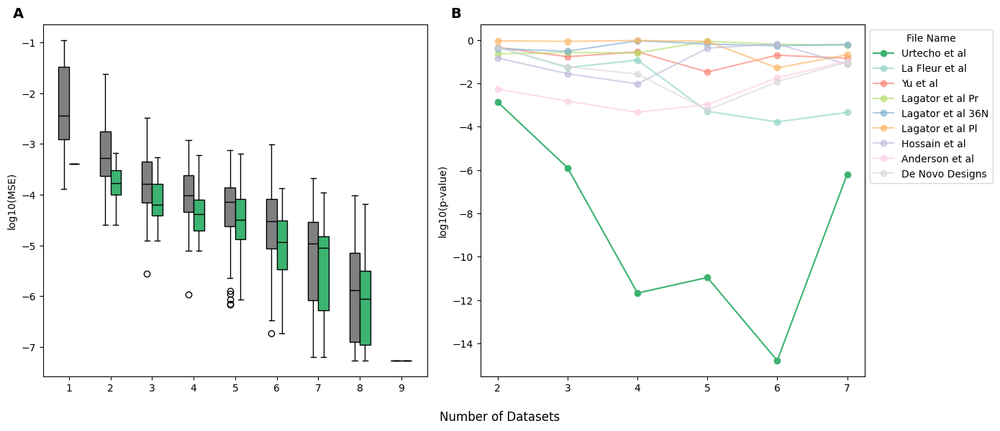

In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

# ---------------- Load and Prepare Data --------------------
file_names = pd.read_csv('Data/LaFleur_supp.csv')['File Name'].unique()
target_files = ['Urtecho et al']

data_df = pd.read_csv('Data/data_comparison.csv')
data = data_df[['Number of Files', 'MSE', 'Name']].values

# ---------------- P-Value Calculation --------------------
def get_file_mse(data):
    return {
        tuple(sorted(combo.split(', '))): mse 
        for _, mse, combo in data
    }

def calculate_pvalues(file_names, combo_to_mse, start=2, end=7):
    p_values = {file: {} for file in file_names}
    for size in range(start, end + 1):
        combos = {k: v for k, v in combo_to_mse.items() if len(k) == size}
        for file in file_names:
            include = [v for k, v in combos.items() if file in k]
            exclude = [v for k, v in combos.items() if file not in k]
            if len(include) > 1 and len(exclude) > 1:
                _, p = ttest_ind(include, exclude, equal_var=False)
                p_values[file][f'{size}'] = p
            else:
                p_values[file][f'{size}'] = np.nan
    return pd.DataFrame(p_values).T.reset_index().rename(columns={'index': 'File Name'})

def reshape_for_plotting(df):
    df_long = df.melt(id_vars='File Name', var_name='Num_Datasets', value_name='p_value')
    df_long['Num_Datasets'] = df_long['Num_Datasets'].astype(int)
    df_long['log10_p_value'] = np.log10(df_long['p_value'].replace(0, np.nan))
    return df_long

combo_to_mse = get_file_mse(data)
df_pvalues = calculate_pvalues(file_names, combo_to_mse)
df_long = reshape_for_plotting(df_pvalues)

# ---------------- Plotting --------------------
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), sharex=False)

# --- Subplot 1: MSE Boxplots ---

# Define bold colors for target files
bold_colors = {'Urtecho et al': 'mediumseagreen'}
muted_colors = {name: plt.cm.Set3(i) for i, name in enumerate(file_names) if name not in bold_colors}

colors = {**bold_colors, **muted_colors}

x_all = sorted(set(int(n) for n, _, _ in data))

labeled=True
offset = 0.125
for x in x_all:
    y_vals = [l for n, l, combo in data if int(n) == x]
    ax1.boxplot([y_vals], positions=[x - offset], widths=0.25, patch_artist=True,
                   boxprops=dict(facecolor='grey'),
                   medianprops=dict(color='black'), 
                   label="All combinations" if labeled else None)
    labeled=False
    for i, file_name in enumerate(target_files):
        y_vals = [l for n, l, combo in data if int(n) == x and file_name in str(combo)]
        if not y_vals:
            continue

        # Offset x slightly for visual separation
        ax1.boxplot([y_vals], positions=[x + offset], widths=0.25, patch_artist=True,
                   boxprops=dict(facecolor=colors[file_name]), showfliers=False,
                   medianprops=dict(color='black'),
                   label=f"With {file_name}" if x == x_all[0] else None)

ax1.set_xticks(x_all)
ax1.set_xticklabels(x_all)

ax1.set_ylabel('log10(MSE)')
# ax1.legend()
ax1.text(-0.05, 1.05, "A", transform=ax1.transAxes, ha='right', va='top', fontsize=14, fontweight='bold')

# --- Subplot 2: P-Values Plot ---
file_order = [
    'Urtecho et al', 'La Fleur et al', 'Yu et al', 'Lagator et al Pr',
    'Lagator et al 36N', 'Lagator et al Pl', 'Hossain et al',
    'Anderson et al', 'De Novo Designs'
]
for file in file_order:
    if file not in df_long['File Name'].values:
        continue
    group = df_long[df_long['File Name'] == file]
    ax2.plot(
        group['Num_Datasets'],
        group['log10_p_value'],
        marker='o',
        label=file,
        color=colors[file],
        alpha=1 if file in target_files else 0.65,
    )

ax2.set_ylabel('log10(p-value)')
ax2.legend(title='File Name', loc='upper left', bbox_to_anchor=(1, 1))

ax2.text(-0.05, 1.05, "B", transform=ax2.transAxes, ha='right', va='top', fontsize=14, fontweight='bold')

fig.supxlabel("Number of Datasets")

plt.tight_layout()
plt.show()


# Save the figure
fig.savefig('Figures/Figure1.pdf', dpi=300, bbox_inches='tight')

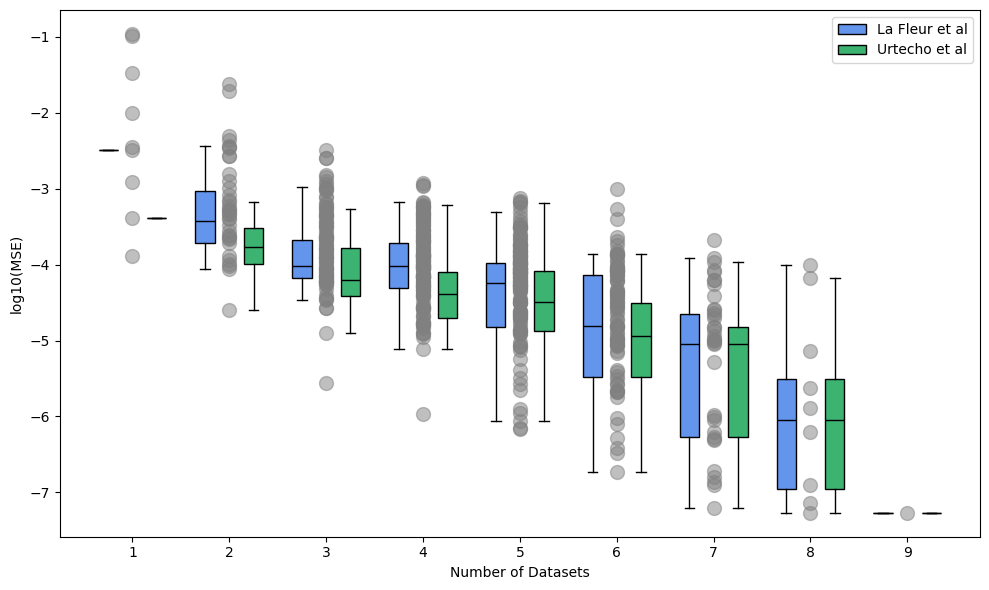

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load file names
file_names = pd.read_csv('Data/LaFleur_supp.csv')['File Name'].unique()
target_includes = ['La Fleur et al', 'Urtecho et al']
file_names = [f for f in file_names if f in target_includes]

data_df = pd.read_csv('Data/data_comparison.csv')
data = data_df[['Number of Files', 'MSE', 'Name']].values

fig, ax = plt.subplots(figsize=(10, 6))

colors = {
    'La Fleur et al': 'cornflowerblue',
    'Urtecho et al': 'mediumseagreen'
}

x_all = sorted(set(int(n) for n, _, _ in data))

# Scatter plot
scatter_data = [(int(n), l) for n, l, _ in data]
x_vals, y_vals = zip(*scatter_data)
ax.scatter(x_vals, y_vals, s=100, alpha=0.5, color='grey')

# Boxplots
for x in x_all:
    for i, file_name in enumerate(target_includes):
        y_vals = [l for n, l, combo in data if int(n) == x and file_name in str(combo)]
        if not y_vals:
            continue

        # Offset x slightly for visual separation
        offset = -0.25 if i == 0 else 0.25
        ax.boxplot([y_vals], positions=[x + offset], widths=0.2, patch_artist=True,
                   boxprops=dict(facecolor=colors[file_name]), showfliers=False,
                   medianprops=dict(color='black'),
                   label=file_name if x == x_all[0] else None)

ax.set_xticks(x_all)
ax.set_xticklabels(x_all)

ax.set_xlabel('Number of Datasets')
ax.set_ylabel('log10(MSE)')
ax.legend()

plt.tight_layout()
plt.show()

# Save the figure
# fig.savefig('Figures/Figure 2 (boxplot).pdf', dpi=300, bbox_inches='tight')


3 Files: t-stat = -5.4735, p = 0.0000 (Significant)
4 Files: t-stat = -8.0197, p = 0.0000 (Significant)
5 Files: t-stat = -7.5630, p = 0.0000 (Significant)
6 Files: t-stat = -9.8354, p = 0.0000 (Significant)


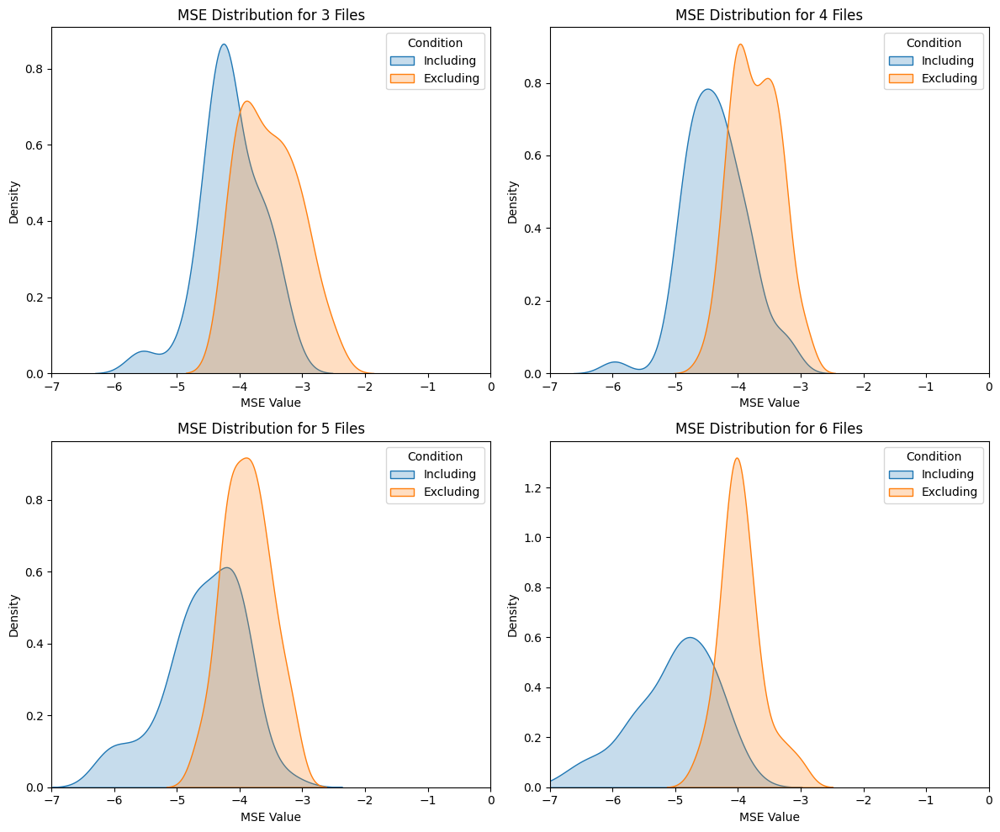

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import numpy as np
from itertools import combinations, chain

def get_file_mse_effect(file_names, data_for_plot):
    all_combos = list(chain.from_iterable(combinations(file_names, i) for i in range(1, len(file_names) + 1)))
    file_mse = {tuple(sorted(combo)): None for combo in all_combos}
    
    for combo_str, mse in [(row[2], row[1]) for row in data_for_plot]:
        combo_key = tuple(sorted(combo_str.split(', ')))
        file_mse[combo_key] = mse

    mse_effect = {file: [] for file in file_names}
    
    for combo, value in file_mse.items():
        for file in file_names:
            if file in combo:
                continue
            extended_combo = tuple(sorted(combo + (file,)))
            mse_diff = value - file_mse.get(extended_combo, 0)
            mse_effect[file].append(mse_diff)
    
    return file_mse, mse_effect

def group_mse_by_count(file_mse, file_of_interest, total_files):
    grouped = {True: {i: [] for i in range(1, total_files + 1)},
               False: {i: [] for i in range(1, total_files + 1)}}
    
    for combo, mse in file_mse.items():
        included = file_of_interest in combo
        grouped[included][len(combo)].append(mse)
    
    return grouped[True], grouped[False]

def plot_mse_distributions(include_mse, exclude_mse, start_from, end_at, file_of_interest):
    num_plots = end_at - start_from + 1
    n_cols = 2
    n_rows = (num_plots + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 5))
    axes = axes.flatten()

    for idx, i in enumerate(range(start_from, end_at + 1)):
        inc, exc = include_mse[i], exclude_mse[i]

        if len(inc) > 1 and len(exc) > 1:
            t_stat, p_val = ttest_ind(inc, exc, equal_var=False)
            sig = " (Significant)" if p_val < 0.05 else ""
            print(f"{i} Files: t-stat = {t_stat:.4f}, p = {p_val:.4f}{sig}")
        else:
            print(f"{i} Files: Not enough data for t-test.")

        sns.kdeplot(inc, label='Including', fill=True, warn_singular=False, ax=axes[idx])
        sns.kdeplot(exc, label='Excluding', fill=True, warn_singular=False, ax=axes[idx])

        axes[idx].set_title(f'MSE Distribution for {i} Files')
        axes[idx].set_xlabel('MSE Value')
        axes[idx].set_ylabel('Density')
        axes[idx].set_xlim(-7, 0)
        axes[idx].legend(title='Condition')

    plt.tight_layout()
    plt.show()
    return fig

# Main script
file_names = pd.read_csv('Data/LaFleur_supp.csv')['File Name'].unique()
data_for_plot = pd.read_csv('Data/data_comparison.csv').values
file_of_interest = 'Urtecho et al'
start_from, end_at = 3, 6

file_mse, mse_effect = get_file_mse_effect(file_names, data_for_plot)
include_mse, exclude_mse = group_mse_by_count(file_mse, file_of_interest, len(file_names))
fig = plot_mse_distributions(include_mse, exclude_mse, start_from, end_at or len(file_names) - 1, file_of_interest)

# Save the figure
# fig.savefig('Figures/Figure 2 (distribution).pdf', dpi=300, bbox_inches='tight')


### Figure 3
-----

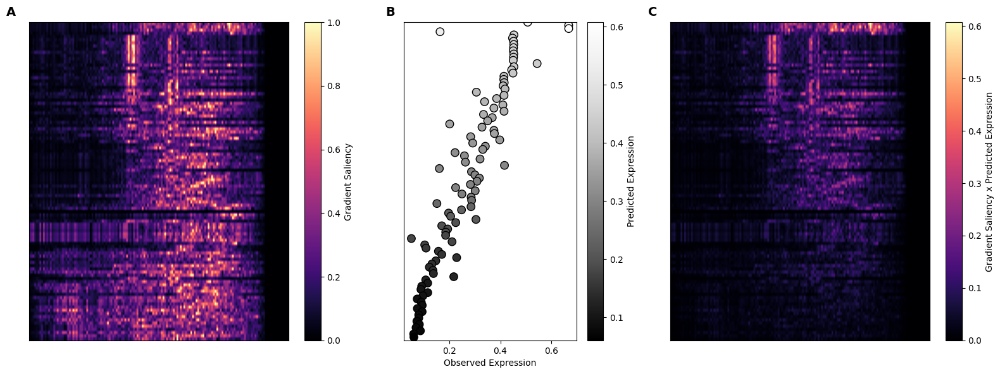

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
import tensorflow as tf
from tensorflow.keras.models import load_model  # type: ignore
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# -------------------- Data Preprocessing Functions --------------------

def combine_columns(df):
    X = df['Promoter Sequence'].astype(str)
    y = MinMaxScaler().fit_transform(df[['Observed log(TX/Txref)']].abs())
    return X, y

def padded_one_hot_encode(seq):
    mapping = {'A': [1,0,0,0], 'C': [0,1,0,0], 'G': [0,0,1,0], 'T': [0,0,0,1], '0': [0,0,0,0]}
    return [mapping[n.upper()] for n in seq]

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

# ----------------------- Generate Saliency Maps -----------------------

def generate_saliency_map(model, sequence):
    input_tensor = tf.convert_to_tensor(sequence[np.newaxis, ...], dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(input_tensor)
        prediction = model(input_tensor)[0, 0]
    gradient = tape.gradient(prediction, input_tensor)
    gradient = tf.norm(gradient, axis=-1)
    return (gradient / tf.reduce_max(gradient)).numpy()

# -------------------- Main Execution --------------------

# load data and preprocess
df = pd.read_csv('Data/LaFleur_supp.csv')
X, y = combine_columns(df)
X = preprocess_sequences(X)
_, X_test, _, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Variables for plotting
model_filename='Models/CNN_6_1_2.keras'
data=X_test
y_vals=y_test
num_samples=100
random_state=1

model = load_model(model_filename)

# ----------------------- Generate Saliency Maps -----------------------

# randomly select "num_samples" sequences from the data
np.random.seed(random_state)
indices = np.random.choice(len(data), size=min(num_samples, len(data)), replace=False)
sequences = data[indices]
y_subset = y_vals[indices]

predictions = []
saliency_maps = []
relative_saliency_maps = []

for seq in sequences:
    pred = model(tf.convert_to_tensor(seq[np.newaxis, ...], dtype=tf.float32))[0, 0].numpy()
    saliency = np.abs(generate_saliency_map(model, seq))
    saliency = np.nan_to_num(saliency)
    
    predictions.append(pred)
    saliency_maps.append(saliency)
    relative_saliency_maps.append(pred * saliency)

# Sort by predictions
sort_idx = np.argsort(predictions)[::-1]
predictions = [predictions[i] for i in sort_idx]
saliency_maps = [saliency_maps[i] for i in sort_idx]
relative_saliency_maps = [relative_saliency_maps[i] for i in sort_idx]
y_subset = [y_subset[i] for i in sort_idx]

saliency_matrix = np.vstack(saliency_maps)
relative_saliency_matrix = np.vstack(relative_saliency_maps)

# ------------------------- Plot Saliency Maps -------------------------

fig = plt.figure(figsize=(16, 6))
# gs = gridspec.GridSpec(1, 3, width_ratios=[2, 1, 2])
gs = gridspec.GridSpec(1, 3, width_ratios=[3, 2, 3])

ax0 = fig.add_subplot(gs[0])
ax1 = fig.add_subplot(gs[1])
ax2 = fig.add_subplot(gs[2])

# Left plot: saliency map
im = ax0.imshow(
    saliency_matrix,
    cmap='magma',
    aspect='auto',
    vmin=saliency_matrix.min(),
    vmax=saliency_matrix.max()
)
ax0.set_xticks([])
ax0.set_yticks([])

fig.colorbar(im, ax=ax0, label='Gradient Saliency')

ax0.text(-0.05, 1.05, "A", transform=ax0.transAxes, ha='right', va='top', fontsize=14, fontweight='bold')

# Middle plot: scatter
# ax1.scatter(y_subset, range(len(y_subset)), cmap='Greys', c=predictions, s=80, edgecolor='black')
ax1.scatter(y_subset, range(len(y_subset)), cmap='Greys_r', c=predictions, s=80, edgecolor='black')
ax1.invert_yaxis()
ax1.set_xlabel("Observed Expression")
ax1.set_ylim(len(y_subset), 0)
ax1.set_yticks([])

# add color bar
cbar = plt.colorbar(ax1.collections[0], ax=ax1, label='Predicted Expression')

ax1.text(-0.05, 1.05, "B", transform=ax1.transAxes, ha='right', va='top', fontsize=14, fontweight='bold')

# Right plot: saliency map
im = ax2.imshow(
    relative_saliency_matrix,
    cmap='magma',
    aspect='auto',
    vmin=relative_saliency_matrix.min(),
    vmax=relative_saliency_matrix.max()
)
ax2.set_xticks([])
ax2.set_yticks([])

fig.colorbar(im, ax=ax2, label='Gradient Saliency x Predicted Expression')

ax2.text(-0.05, 1.05, "C", transform=ax2.transAxes, ha='right', va='top', fontsize=14, fontweight='bold')

plt.tight_layout()
# plt.savefig('Figures/Figure 3_observed.pdf', dpi=300, bbox_inches='tight')
plt.show()


c:\Users\rsore\anaconda3\envs\TX_prediction\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 34 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
C:\Users\rsore\AppData\Local\Temp\ipykernel_25264\3660885015.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


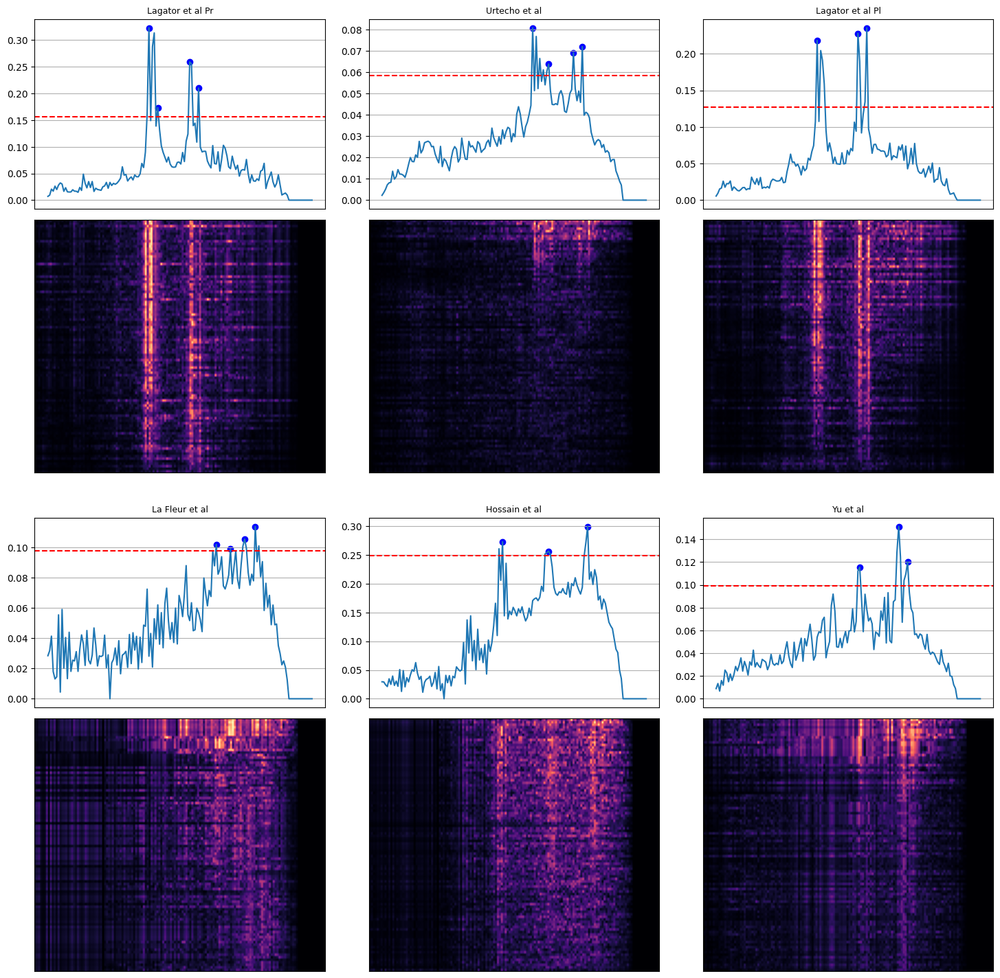

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import load_model  # type: ignore
from scipy.signal import find_peaks
import matplotlib.gridspec as gridspec

# -------------------- Data Preprocessing Functions --------------------

def combine_columns(df):
    X = df['Promoter Sequence'].astype(str)
    y = MinMaxScaler().fit_transform(df[['Observed log(TX/Txref)']].abs())
    return X, y

def padded_one_hot_encode(seq):
    mapping = {'A': [1,0,0,0], 'C': [0,1,0,0], 'G': [0,0,1,0], 'T': [0,0,0,1], '0': [0,0,0,0]}
    return [mapping[n.upper()] for n in seq]

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

# ----------------------- Generate Saliency Maps -----------------------

def generate_saliency_map(model, sequence):
    input_tensor = tf.convert_to_tensor(sequence[np.newaxis, ...], dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(input_tensor)
        prediction = model(input_tensor)[0, 0]
    gradient = tape.gradient(prediction, input_tensor)
    gradient = tf.norm(gradient, axis=-1)
    return (gradient / tf.reduce_max(gradient)).numpy()

def plot_saliency_map_grid_combined(
    model_filename,
    data,
    num_samples=100,
    random_state=42,
    ax_line=None,
    ax_imshow=None,
    title=None,
    colorbar=False,
):
    model = load_model(model_filename)
    np.random.seed(random_state)
    sequences = data[np.random.choice(len(data), size=min(num_samples, len(data)), replace=False)]
    saliency_maps = []
    predictions = []

    for seq in sequences:
        pred = model(tf.convert_to_tensor(seq[np.newaxis, ...], dtype=tf.float32))[0, 0].numpy()
        saliency = np.abs(generate_saliency_map(model, seq)).flatten()
        saliency = np.nan_to_num(saliency)
        saliency = pred * saliency
        predictions.append(pred)
        saliency_maps.append(saliency)

    saliency_maps = [saliency_maps[i] for i in np.argsort(predictions)[::-1]]
    averaged_saliency_maps = np.mean(np.stack(saliency_maps), axis=0)
    q3_iqr = np.percentile(averaged_saliency_maps, 95)
    peaks, _ = find_peaks(averaged_saliency_maps, height=q3_iqr, distance=5)

    # Line plot
    if ax_line:
        ax_line.plot(averaged_saliency_maps)
        ax_line.axhline(q3_iqr, color="red", linestyle="--")
        ax_line.scatter(peaks, averaged_saliency_maps[peaks], color="blue")
        ax_line.set_title(f"{title}", fontsize=9)
        ax_line.set_xticks([])
        ax_line.grid(True)

    # Heatmap
    saliency_matrix = np.vstack(saliency_maps)
    im = ax_imshow.imshow(
        saliency_matrix,
        cmap='magma',
        aspect='auto',
        vmin=saliency_matrix.min(),
        vmax=saliency_matrix.max()
    )
    ax_imshow.set_xticks([])
    ax_imshow.set_yticks([])
    if colorbar:
        plt.colorbar(im, ax=ax_imshow, fraction=0.046, pad=0.04)
    return im

# -------------------- Main Execution --------------------

# Load data
df = pd.read_csv('Data/LaFleur_supp.csv')
X, y = combine_columns(df)
X = preprocess_sequences(X)
files = df['File Name'].astype(str)

# Train/test split
indices = np.arange(len(X))
train_idx, test_idx = train_test_split(indices, test_size=0.2, random_state=42)

X_test = X[test_idx]
y_test = y[test_idx]
files_test = files.iloc[test_idx]

# Define files (must match exactly from the dataset)
file_names = ['Lagator et al Pr', 'Urtecho et al', 'Lagator et al Pl', 'La Fleur et al', 'Hossain et al', 'Yu et al']
num_files = len(file_names)

# Create 2x3 grid layout
fig = plt.figure(figsize=(18, 18))
outer_gs = gridspec.GridSpec(2, 3, wspace=0.15, hspace=0.1)

for idx, file_name in enumerate(file_names):
    mask = files_test == file_name
    data_subset = X_test[mask.values]
    if len(data_subset) == 0:
        continue

    row, col = divmod(idx, 3)
    inner_gs = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer_gs[row, col], height_ratios=[1.5, 2], hspace=0.05)

    ax_line = fig.add_subplot(inner_gs[0])
    ax_imshow = fig.add_subplot(inner_gs[1])

    plot_saliency_map_grid_combined(
        model_filename='Models/CNN_6_1_2.keras',
        data=data_subset,
        num_samples=100,
        random_state=1,
        ax_line=ax_line,
        ax_imshow=ax_imshow,
        title=file_name,
        colorbar=False
    )

plt.tight_layout()
# plt.savefig('Figures/Figure 3 (peaks).pdf', dpi=300, bbox_inches='tight')
plt.show()

c:\Users\rsore\anaconda3\envs\TX_prediction\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 34 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
C:\Users\rsore\AppData\Local\Temp\ipykernel_24672\71850449.py:200: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


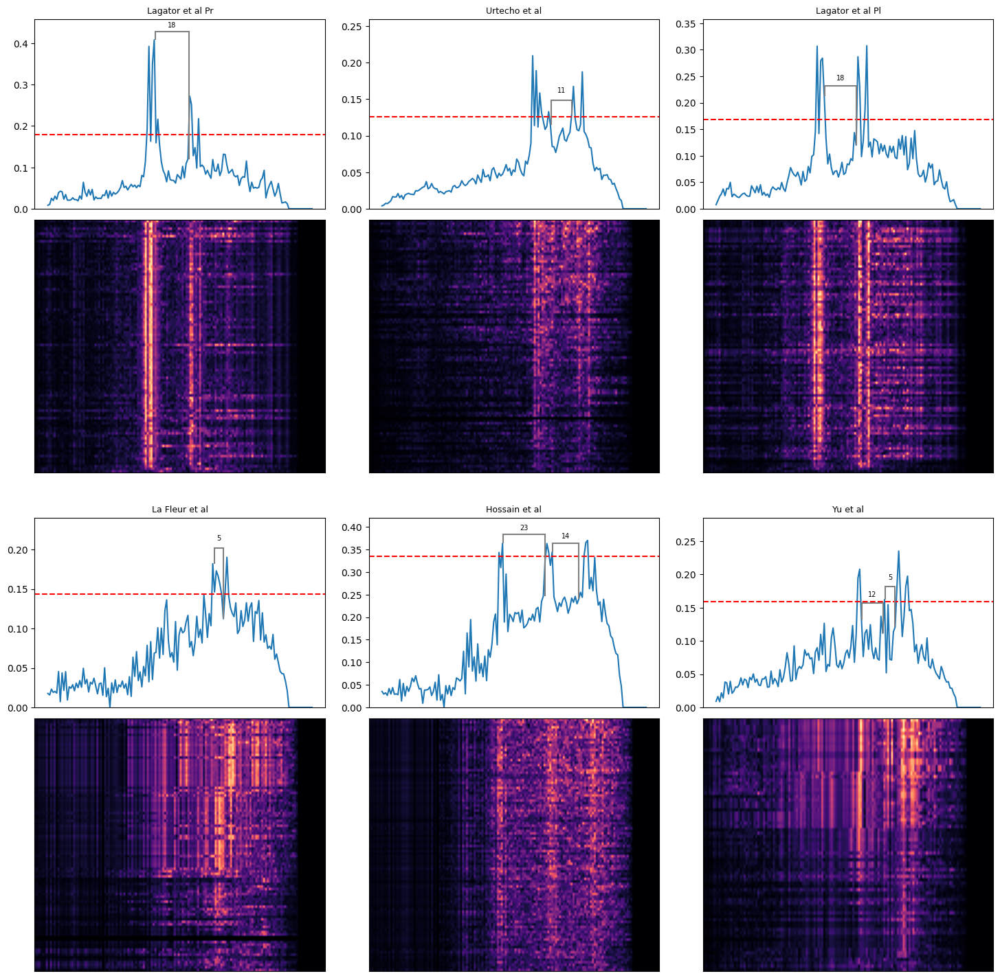

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import load_model  # type: ignore
from scipy.signal import find_peaks, peak_widths
import matplotlib.gridspec as gridspec

# -------------------- Data Preprocessing Functions --------------------

def padded_one_hot_encode(seq):
    mapping = {'A': [1,0,0,0], 'C': [0,1,0,0], 'G': [0,0,1,0], 'T': [0,0,0,1], '0': [0,0,0,0]}
    return [mapping[n.upper()] for n in seq]

# ----------------------- Generate Saliency Maps -----------------------

def generate_saliency_map(model, sequence):
    input_tensor = tf.convert_to_tensor(sequence[np.newaxis, ...], dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(input_tensor)
        prediction = model(input_tensor)[0, 0]
    gradient = tape.gradient(prediction, input_tensor)
    gradient = tf.norm(gradient, axis=-1)
    return (gradient / tf.reduce_max(gradient)).numpy()

def plot_saliency_map_grid_combined(
    model_filename,
    sequences,
    ax_line=None,
    ax_imshow=None,
    file_name=None,
    colorbar=False,
):
    model = load_model(model_filename)
    saliency_maps = []
    predictions = []

    for seq in sequences:
        pred = model(tf.convert_to_tensor(seq[np.newaxis, ...], dtype=tf.float32))[0, 0].numpy()
        saliency = np.abs(generate_saliency_map(model, seq)).flatten()
        saliency = np.nan_to_num(saliency)
        saliency = pred * saliency
        predictions.append(pred)
        saliency_maps.append(saliency)

    saliency_maps = [saliency_maps[i] for i in np.argsort(predictions)[::-1]]
    averaged_saliency_maps = np.mean(np.stack(saliency_maps), axis=0)
    threshold = np.percentile(averaged_saliency_maps, 95)

    peaks, _ = find_peaks(
        averaged_saliency_maps, 
        height=threshold, 
        prominence=file_prominences[file_name],
    )
    results_half = peak_widths(
        averaged_saliency_maps,
        peaks,
        rel_height=file_rel_heights[file_name]
    )
    left_ips = results_half[2]
    right_ips = results_half[3]
    filtered_indices = remove_overlapping_peaks(left_ips, right_ips)

    if ax_line:
        ax_line.plot(averaged_saliency_maps)
        ax_line.axhline(threshold, color="red", linestyle="--")

        ax_line.set_title(f"{file_name}", fontsize=9)
        ax_line.set_xticks([])

        # Sort filtered peaks by left edge position
        sorted_indices = sorted(filtered_indices, key=lambda i: left_ips[i])

        # Annotate distance between widths
        for i in range(len(sorted_indices) - 1):
            right_edge = right_ips[sorted_indices[i]]
            left_edge = left_ips[sorted_indices[i + 1]]

            # Midpoint between right of one width and left of the next
            mid_x = (right_edge + left_edge) / 2
            width_between = int(left_edge - right_edge)
            if width_between < 4:
                continue

            # Get height for line placement
            left_height = averaged_saliency_maps[int(left_edge)]
            right_height = averaged_saliency_maps[int(right_edge)]
            line_y = max(averaged_saliency_maps[int(right_edge):int(left_edge) + 1]) + 0.02

            # Draw horizontal and vertical lines
            ax_line.plot([right_edge, left_edge], [line_y, line_y], color='gray')
            ax_line.vlines([right_edge, left_edge], [right_height, left_height], [line_y, line_y], color='gray')

            # Add width label
            ax_line.text(mid_x, line_y + 0.01, width_between, ha='center', fontsize=7)

        max_val = max(averaged_saliency_maps) + 0.05
        ax_line.set_ylim(0, max_val)

    saliency_matrix = np.vstack(saliency_maps)
    im = ax_imshow.imshow(
        saliency_matrix,
        cmap='magma',
        aspect='auto',
        vmin=saliency_matrix.min(),
        vmax=saliency_matrix.max()
    )
    ax_imshow.set_xticks([])
    ax_imshow.set_yticks([])
    if colorbar:
        plt.colorbar(im, ax=ax_imshow, fraction=0.046, pad=0.04)
    return im

def remove_overlapping_peaks(left_ips, right_ips):
    filtered_indices = []
    used_ranges = []

    for i, (left, right) in enumerate(zip(left_ips, right_ips)):
        overlap = False
        for l2, r2 in used_ranges:
            if not (right < l2 or left > r2):
                overlap = True
                break
        if not overlap:
            filtered_indices.append(i)
            used_ranges.append((left, right))

    return np.array(filtered_indices)

# -------------------- Main Execution --------------------

# Load data
df = pd.read_csv('Data/LaFleur_supp.csv')[['Promoter Sequence', 'Observed log(TX/Txref)', 'File Name']]

# Preprocess data
df['Promoter Sequence'] = df['Promoter Sequence'].astype(str).apply(lambda x: padded_one_hot_encode(x.zfill(150)))
df['Observed log(TX/Txref)'] = MinMaxScaler().fit_transform(df[['Observed log(TX/Txref)']].abs())

# Split into train/test (only using test)
indices = np.arange(len(df))
_, test_idx = train_test_split(indices, test_size=0.2, random_state=42)
test_df = df.iloc[test_idx].copy()

# File names to analyze
file_names = ['Lagator et al Pr', 'Urtecho et al', 'Lagator et al Pl', 'La Fleur et al', 'Hossain et al', 'Yu et al']
num_files = len(file_names)

# Define variables for peak prominence and relative height
file_prominences = {
    'Lagator et al Pr': 0.15,
    'Urtecho et al': 0.05,
    'Lagator et al Pl': 0.1,
    'La Fleur et al': 0.05,
    'Hossain et al': 0.1,
    'Yu et al': 0.05
}
file_rel_heights = {
    'Lagator et al Pr': 0.4,
    'Urtecho et al': 0.5,
    'Lagator et al Pl': 0.65,
    'La Fleur et al': 0.4,
    'Hossain et al': 0.35,
    'Yu et al': 0.5
}

# Create 2x3 grid layout
fig = plt.figure(figsize=(18, 18))
outer_gs = gridspec.GridSpec(2, 3, wspace=0.15, hspace=0.1)

for idx, file_name in enumerate(file_names):
    subset_df = test_df[test_df['File Name'] == file_name]
    
    # get the top Observed log(TX/Txref) from the subset
    q3_iqr = np.percentile(subset_df['Observed log(TX/Txref)'], 75)
    subset_df = subset_df[subset_df['Observed log(TX/Txref)'] > q3_iqr]
    sequences = subset_df.sample(n=min(100, len(subset_df)), random_state=1)

    data_subset = np.array(sequences['Promoter Sequence'].tolist())

    if len(data_subset) == 0:
        continue

    row, col = divmod(idx, 3)
    inner_gs = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer_gs[row, col], height_ratios=[1.5, 2], hspace=0.05)

    ax_line = fig.add_subplot(inner_gs[0])
    ax_imshow = fig.add_subplot(inner_gs[1])

    plot_saliency_map_grid_combined(
        model_filename='Models/CNN_6_1_2.keras',
        sequences=data_subset,
        ax_line=ax_line,
        ax_imshow=ax_imshow,
        file_name=file_name,
        colorbar=False
    )

plt.tight_layout()
# plt.savefig('Figures/Figure 3 (peak distances).pdf', dpi=300, bbox_inches='tight')
plt.show()


c:\Users\rsore\anaconda3\envs\TX_prediction\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 34 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
C:\Users\rsore\AppData\Local\Temp\ipykernel_29160\1442297510.py:164: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


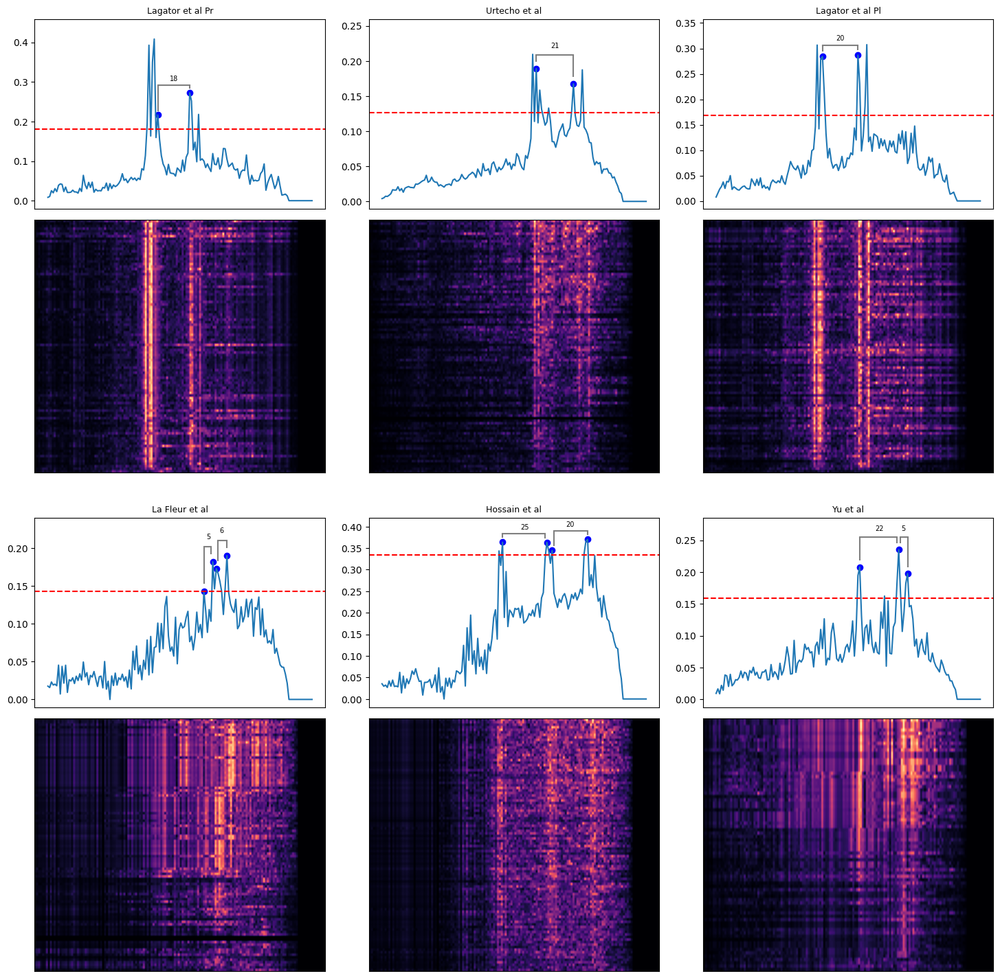

In [83]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import load_model  # type: ignore
from scipy.signal import find_peaks
import matplotlib.gridspec as gridspec

# -------------------- Data Preprocessing Functions --------------------

def padded_one_hot_encode(seq):
    mapping = {'A': [1,0,0,0], 'C': [0,1,0,0], 'G': [0,0,1,0], 'T': [0,0,0,1], '0': [0,0,0,0]}
    return [mapping[n.upper()] for n in seq]

# ----------------------- Generate Saliency Maps -----------------------

def generate_saliency_map(model, sequence):
    input_tensor = tf.convert_to_tensor(sequence[np.newaxis, ...], dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(input_tensor)
        prediction = model(input_tensor)[0, 0]
    gradient = tape.gradient(prediction, input_tensor)
    gradient = tf.norm(gradient, axis=-1)
    return (gradient / tf.reduce_max(gradient)).numpy()

def plot_saliency_map_grid_combined(
    model_filename,
    sequences,
    ax_line=None,
    ax_imshow=None,
    file_name=None,
    colorbar=False,
):
    model = load_model(model_filename)
    saliency_maps = []
    predictions = []

    for seq in sequences:
        pred = model(tf.convert_to_tensor(seq[np.newaxis, ...], dtype=tf.float32))[0, 0].numpy()
        saliency = np.abs(generate_saliency_map(model, seq)).flatten()
        saliency = np.nan_to_num(saliency)
        saliency = pred * saliency
        predictions.append(pred)
        saliency_maps.append(saliency)

    saliency_maps = [saliency_maps[i] for i in np.argsort(predictions)[::-1]]
    averaged_saliency_maps = np.mean(np.stack(saliency_maps), axis=0)
    threshold = np.percentile(averaged_saliency_maps, 95)
    peaks = peak_points[file_name]

    if ax_line:
        ax_line.plot(averaged_saliency_maps)
        ax_line.axhline(threshold, color="red", linestyle="--")
        ax_line.scatter(peaks, averaged_saliency_maps[peaks], color="blue")
        ax_line.set_title(f"{file_name}", fontsize=9)
        ax_line.set_xticks([])

        # Annotate distances between peaks
        peak_pair = peak_pairs[file_name]
        for i, (start, stop) in enumerate(peak_pair):
            x1, x2 = start, stop
            y1 = averaged_saliency_maps[x1] + 0.01
            y2 = averaged_saliency_maps[x2] + 0.01
            line_y = max(averaged_saliency_maps[x1-1:x2+1]) + 0.02
            distance = x2 - x1
            mid_x = (x1 + x2) / 2

            # Offset for the first and last peaks
            if len(peaks) <= 2:
                offset1, offset2 = 0, 0
            else:
                offset1 = 0 if i == 0 else 1
                offset2 = 0 if i == len(peak_pair)-1 else 1

            # Draw horizontal and vertical lines
            ax_line.plot([x1 + offset1, x2 - offset2], [line_y] * 2, color='gray')
            ax_line.vlines([x1 + offset1, x2 - offset2], [y1, y2], line_y, color='gray')

            # Add distance text
            ax_line.text(mid_x, line_y + 0.01, str(distance), ha='center', fontsize=7)

        max_val = max(averaged_saliency_maps) + 0.05
        ax_line.set_ylim(top=max_val)

    saliency_matrix = np.vstack(saliency_maps)
    im = ax_imshow.imshow(
        saliency_matrix,
        cmap='magma',
        aspect='auto',
        vmin=saliency_matrix.min(),
        vmax=saliency_matrix.max()
    )
    ax_imshow.set_xticks([])
    ax_imshow.set_yticks([])
    if colorbar:
        plt.colorbar(im, ax=ax_imshow, fraction=0.046, pad=0.04)
    return im

# -------------------- Main Execution --------------------

# Load data
df = pd.read_csv('Data/LaFleur_supp.csv')[['Promoter Sequence', 'Observed log(TX/Txref)', 'File Name']]

# Preprocess data
df['Promoter Sequence'] = df['Promoter Sequence'].astype(str).apply(lambda x: padded_one_hot_encode(x.zfill(150)))
df['Observed log(TX/Txref)'] = MinMaxScaler().fit_transform(df[['Observed log(TX/Txref)']].abs())

# Split into train/test (for demonstration – only using test set here)
indices = np.arange(len(df))
train_idx, test_idx = train_test_split(indices, test_size=0.2, random_state=42)
test_df = df.iloc[test_idx].copy()

# File names to analyze
file_names = ['Lagator et al Pr', 'Urtecho et al', 'Lagator et al Pl', 'La Fleur et al', 'Hossain et al', 'Yu et al']
num_files = len(file_names)

# Create 2x3 grid layout
fig = plt.figure(figsize=(18, 18))
outer_gs = gridspec.GridSpec(2, 3, wspace=0.15, hspace=0.1)

peak_pairs = {
    'Lagator et al Pr': [(62, 80)],
    'Urtecho et al': [(87, 108)],
    'Lagator et al Pl': [(60, 80)],
    'La Fleur et al': [(88, 93), (95, 101)],
    'Hossain et al': [(68, 93), (96, 116)],
    'Yu et al': [(81, 103), (103, 108)]
}

# get all points from the peak_pairs dictionary
peak_points = {key: sorted(list({point for pair in pairs for point in pair})) for key, pairs in peak_pairs.items()}

for idx, file_name in enumerate(file_names):
    subset_df = test_df[test_df['File Name'] == file_name]
    
    # get the top Observed log(TX/Txref) from the subset
    threshold = np.percentile(subset_df['Observed log(TX/Txref)'], 75)
    subset_df = subset_df[subset_df['Observed log(TX/Txref)'] > threshold]
    sequences = subset_df.sample(n=min(100, len(subset_df)), random_state=1)

    # sequences = subset_df.sort_values(by='Observed log(TX/Txref)', ascending=False).head(100)
    data_subset = np.array(sequences['Promoter Sequence'].tolist())

    if len(data_subset) == 0:
        continue

    row, col = divmod(idx, 3)
    inner_gs = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer_gs[row, col], height_ratios=[1.5, 2], hspace=0.05)

    ax_line = fig.add_subplot(inner_gs[0])
    ax_imshow = fig.add_subplot(inner_gs[1])

    plot_saliency_map_grid_combined(
        model_filename='Models/CNN_6_1_2.keras',
        sequences=data_subset,
        ax_line=ax_line,
        ax_imshow=ax_imshow,
        file_name=file_name,
        colorbar=False
    )

plt.tight_layout()
# plt.savefig('Figures/Figure 3 (peak distances).pdf', dpi=300, bbox_inches='tight')
plt.show()


### Figure 4
-----

 33/305 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step  

c:\Users\rsore\anaconda3\envs\TX_prediction\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 34 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


305/305 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
305/305 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


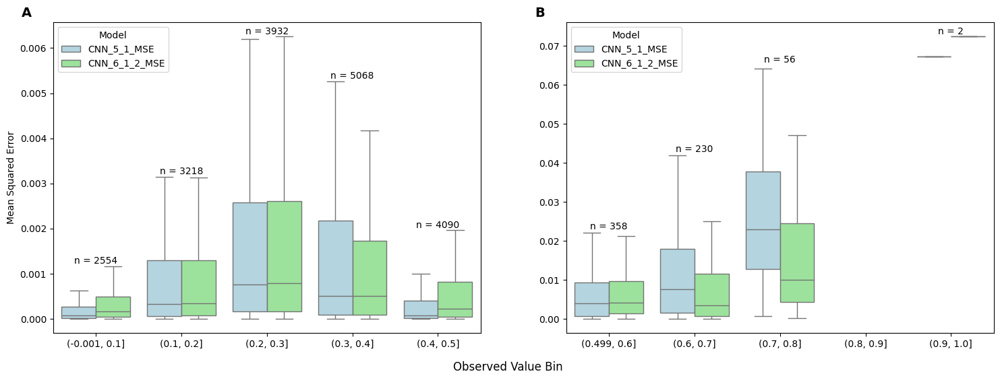

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import load_model  # type: ignore

# -------------------- Data Preprocessing Functions --------------------

def combine_columns(df):
    X = df['Promoter Sequence'].astype(str)
    y = MinMaxScaler().fit_transform(df[['Observed log(TX/Txref)']].abs())
    return X, y

def padded_one_hot_encode(seq):
    mapping = {'A': [1,0,0,0], 'C': [0,1,0,0], 'G': [0,0,1,0], 'T': [0,0,0,1], '0': [0,0,0,0]}
    return [mapping[n.upper()] for n in seq]

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

# -------------------- Load and Preprocess Data --------------------

df = pd.read_csv('Data/LaFleur_supp.csv')
x, y = combine_columns(df)
X = preprocess_sequences(x)
_, X_test, _, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

CNN_5_1 = load_model('Models/CNN_5_1.keras')
CNN_6_1_2 = load_model('Models/CNN_6_1_2.keras')

df = pd.DataFrame({
    'Observed': y_test.flatten(),
    'CNN_5_1_pred': CNN_5_1.predict(X_test).flatten(),
    'CNN_6_1_2_pred': CNN_6_1_2.predict(X_test).flatten(),
})

df['CNN_5_1_MSE'] = (df['Observed'] - df['CNN_5_1_pred']) ** 2
df['CNN_6_1_2_MSE'] = (df['Observed'] - df['CNN_6_1_2_pred']) ** 2

# -------------------- Plotting MSE Distributions --------------------

bins_low = np.linspace(0, 0.5, 6)
bins_high = np.linspace(0.5, 1, 6)
df['Observed_bin_low'] = pd.cut(df['Observed'], bins_low, include_lowest=True)
df['Observed_bin_high'] = pd.cut(df['Observed'], bins_high, include_lowest=True)

mse_columns = ['CNN_5_1_MSE', 'CNN_6_1_2_MSE']
mse_data_low = pd.melt(
    df,
    id_vars=['Observed_bin_low'],
    value_vars=mse_columns,
    var_name='Model',
    value_name='MSE'
)
mse_data_high = pd.melt(
    df,
    id_vars=['Observed_bin_high'],
    value_vars=mse_columns,
    var_name='Model',
    value_name='MSE'
)

# -------------------- Plotting MSE Distributions as Subplots --------------------

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Count number of samples per bin
counts_low = mse_data_low.groupby('Observed_bin_low', observed=False).size()
counts_high = mse_data_high.groupby('Observed_bin_high', observed=False).size()

# Plot for observed bins < 0.5
sns.boxplot(
    x='Observed_bin_low',
    y='MSE',
    hue='Model',
    data=mse_data_low,
    palette=['lightblue', 'lightgreen'],
    showfliers=False,
    ax=axes[0],
)
axes[0].set_xlabel('')
axes[0].set_ylabel('Mean Squared Error')

# Compute Q3 + 1.5*IQR (upper whisker)
q3_iqr_low = mse_data_low.groupby(['Observed_bin_low', 'Model'], observed=True)['MSE'].agg(
    q3=lambda x: x.quantile(0.75),
    iqr=lambda x: x.quantile(0.75) - x.quantile(0.25)
).reset_index()
q3_iqr_low['upper_whisker'] = q3_iqr_low['q3'] + 1.5 * q3_iqr_low['iqr']
max_whiskers_low = q3_iqr_low.groupby('Observed_bin_low', observed=False)['upper_whisker'].max()

# Annotate above whisker
for i, (bin_label, count) in enumerate(counts_low.items()):
    whisker_top = max_whiskers_low.get(bin_label, 0)
    axes[0].text(i, whisker_top, f'n = {count}', ha='center', va='bottom', fontsize=10)

# Plot for observed bins > 0.5
sns.boxplot(
    x='Observed_bin_high',
    y='MSE',
    hue='Model',
    data=mse_data_high,
    palette=['lightblue', 'lightgreen'],
    showfliers=False,
    ax=axes[1],
)
axes[1].set_xlabel('')
axes[1].set_ylabel('')

q3_iqr_high = mse_data_high.groupby(['Observed_bin_high', 'Model'], observed=True)['MSE'].agg(
    q3=lambda x: x.quantile(0.75),
    iqr=lambda x: x.quantile(0.75) - x.quantile(0.25)
).reset_index()
q3_iqr_high['upper_whisker'] = q3_iqr_high['q3'] + 1.5 * q3_iqr_high['iqr']
max_whiskers_high = q3_iqr_high.groupby('Observed_bin_high', observed=False)['upper_whisker'].max()

for i, (bin_label, count) in enumerate(counts_high.items()):
    whisker_top = max_whiskers_high.get(bin_label, np.nan)
    if np.isfinite(whisker_top):
        offset = -0.01 if i == 2 else 0
        axes[1].text(i, whisker_top + offset, f'n = {count}', ha='center', va='bottom', fontsize=10)

fig.supxlabel('Observed Value Bin')

axes[0].text(-0.05, 1.05, "A", transform=axes[0].transAxes, ha='right', va='top', fontsize=14, fontweight='bold')
axes[1].text(-0.05, 1.05, "B", transform=axes[1].transAxes, ha='right', va='top', fontsize=14, fontweight='bold')

# plt.savefig('Figures/Figure 4.pdf', dpi=300, bbox_inches='tight')
plt.show()

 16/305 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step  

c:\Users\rsore\anaconda3\envs\TX_prediction\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 34 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


305/305 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
305/305 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


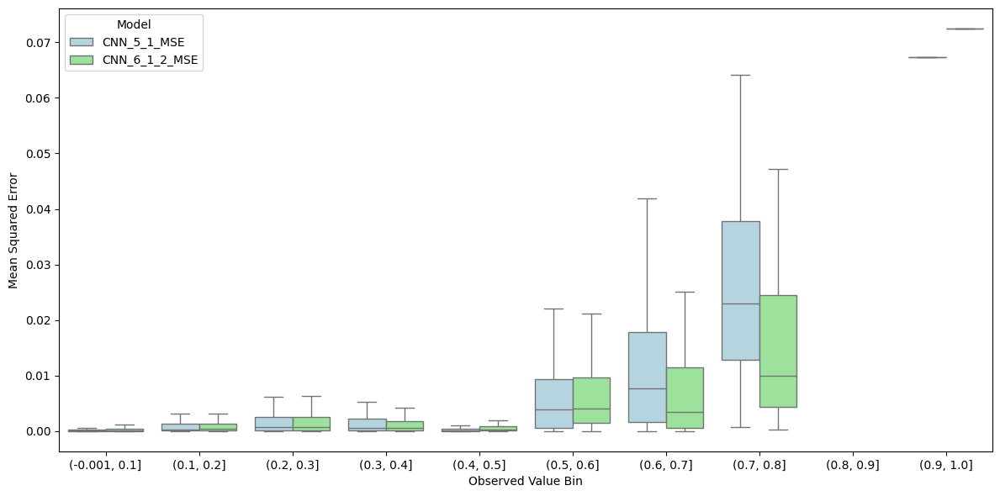

In [100]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import load_model  # type: ignore

# -------------------- Data Preprocessing Functions --------------------

def combine_columns(df):
    X = df['Promoter Sequence'].astype(str)
    y = MinMaxScaler().fit_transform(df[['Observed log(TX/Txref)']].abs())
    return X, y

def padded_one_hot_encode(seq):
    mapping = {'A': [1,0,0,0], 'C': [0,1,0,0], 'G': [0,0,1,0], 'T': [0,0,0,1], '0': [0,0,0,0]}
    return [mapping[n.upper()] for n in seq]

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

# -------------------- Load and Preprocess Data --------------------

df = pd.read_csv('Data/LaFleur_supp.csv')
x, y = combine_columns(df)
X = preprocess_sequences(x)
_, X_test, _, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

CNN_5_1 = load_model('Models/CNN_5_1.keras')
CNN_6_1_2 = load_model('Models/CNN_6_1_2.keras')

df = pd.DataFrame({
    'Observed': y_test.flatten(),
    'CNN_5_1_pred': CNN_5_1.predict(X_test).flatten(),
    'CNN_6_1_2_pred': CNN_6_1_2.predict(X_test).flatten(),
})

df['CNN_5_1_MSE'] = (df['Observed'] - df['CNN_5_1_pred']) ** 2
df['CNN_6_1_2_MSE'] = (df['Observed'] - df['CNN_6_1_2_pred']) ** 2

# -------------------- Plotting MSE Distributions --------------------

bins = np.linspace(0, 1, 11)
df['Observed_bin'] = pd.cut(df['Observed'], bins, include_lowest=True)

mse_columns = ['CNN_5_1_MSE', 'CNN_6_1_2_MSE']
mse_data = pd.melt(
    df,
    id_vars=['Observed_bin'],
    value_vars=mse_columns,
    var_name='Model',
    value_name='MSE'
)

plt.figure(figsize=(12, 6))
sns.boxplot(
    x='Observed_bin',
    y='MSE',
    hue='Model',
    data=mse_data,
    palette=['lightblue', 'lightgreen'],
    showfliers=False
)
# plt.xticks(ticks=np.arange(len(bins) - 1), labels=[bins[i].round(1) for i in range(len(bins) - 1)])
plt.xlabel('Observed Value Bin')
plt.ylabel('Mean Squared Error')
plt.legend(title='Model')
plt.tight_layout()
# plt.yscale('log')

# Save the figure
# plt.savefig('Figures/Figure 4_alt.pdf', dpi=300, bbox_inches='tight')

plt.show()

### Figure 5
-----

 35/305 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  

c:\Users\rsore\anaconda3\envs\TX_prediction\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 34 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


305/305 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
305/305 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


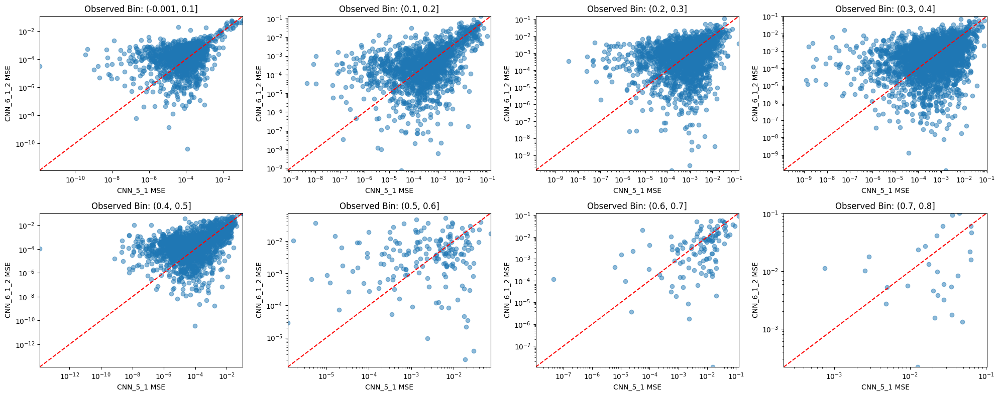

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import load_model  # type: ignore

# -------------------- Data Preprocessing Functions --------------------

def combine_columns(df):
    X = df['Promoter Sequence'].astype(str)
    y = MinMaxScaler().fit_transform(df[['Observed log(TX/Txref)']].abs())
    return X, y

def padded_one_hot_encode(seq):
    mapping = {'A': [1,0,0,0], 'C': [0,1,0,0], 'G': [0,0,1,0], 'T': [0,0,0,1], '0': [0,0,0,0]}
    return [mapping[n.upper()] for n in seq]

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

# -------------------- Load and Preprocess Data --------------------

df = pd.read_csv('Data/LaFleur_supp.csv')
x, y = combine_columns(df)
X = preprocess_sequences(x)
_, X_test, _, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

CNN_5_1 = load_model('Models/CNN_5_1.keras')
CNN_6_1_2 = load_model('Models/CNN_6_1_2.keras')

df = pd.DataFrame({
    'Observed': y_test.flatten(),
    'CNN_5_1_pred': CNN_5_1.predict(X_test).flatten(),
    'CNN_6_1_2_pred': CNN_6_1_2.predict(X_test).flatten(),
})

df['CNN_5_1_MSE'] = (df['Observed'] - df['CNN_5_1_pred']) ** 2
df['CNN_6_1_2_MSE'] = (df['Observed'] - df['CNN_6_1_2_pred']) ** 2

# -------------------- Binning Observations  --------------------

bins = np.linspace(0, 1, 11)
df['Observed_bin'] = pd.cut(df['Observed'], bins, include_lowest=True)
non_empty_bins = [(label, df[df['Observed_bin'] == label]) for label in df['Observed_bin'].cat.categories if len(df[df['Observed_bin'] == label]) > 1]

# -------------------- Scatterplots: MSE Comparison by Bin --------------------

fig, axs = plt.subplots(2, 4, figsize=(20, 8))
axs = axs.flatten()

for i, (bin_label, bin_data) in enumerate(non_empty_bins):
    min_mse = bin_data[['CNN_5_1_MSE', 'CNN_6_1_2_MSE']].min().min()
    max_mse = bin_data[['CNN_5_1_MSE', 'CNN_6_1_2_MSE']].max().max()

    axs[i].scatter(bin_data['CNN_5_1_MSE'], bin_data['CNN_6_1_2_MSE'], alpha=0.5)
    axs[i].plot([min_mse, max_mse], [min_mse, max_mse], 'r--', label='y=x')

    axs[i].set_xscale('log')
    axs[i].set_yscale('log')

    axs[i].set_xlim(min_mse, max_mse)
    axs[i].set_ylim(min_mse, max_mse)

    axs[i].set_title(f'Observed Bin: {bin_label}')
    axs[i].set_xlabel('CNN_5_1 MSE')
    axs[i].set_ylabel('CNN_6_1_2 MSE')

# Hide unused subplots
for j in range(i + 1, len(axs)):
    axs[j].set_visible(False)

plt.tight_layout()
# plt.savefig('Figures/Figure 5.pdf', dpi=300, bbox_inches='tight')
plt.show()


### Figure 6
-----

87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


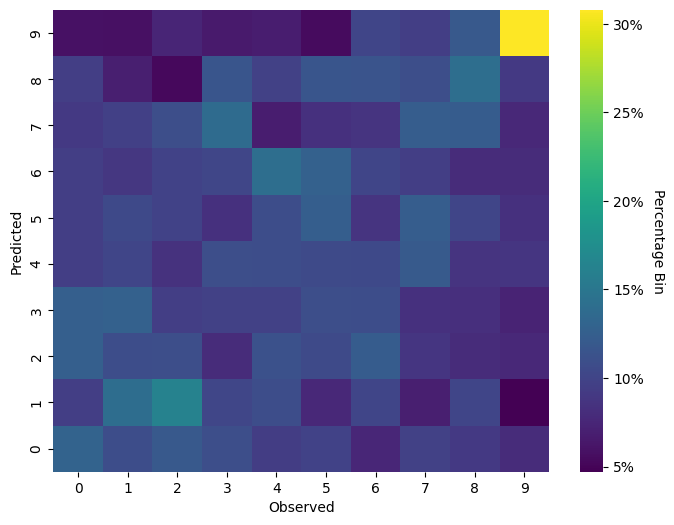

In [26]:
# Heatmap of TSSs dataset (fig 1) predictions (with inactive variants removed)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.saving import load_model  # type: ignore
import seaborn as sns
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import MinMaxScaler

from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import wasserstein_distance

# -------------------- Data Preprocessing Functions --------------------

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

def padded_one_hot_encode(sequence):
    mapping = {'A': [1, 0, 0, 0], 'C': [0, 1, 0, 0], 'G': [0, 0, 1, 0], 'T': [0, 0, 0, 1], '0': [0, 0, 0, 0]}
    return np.array([mapping[nucleotide.upper()] for nucleotide in sequence])

model = load_model('Models/CNN_6_1_2.keras')

df = pd.read_csv('Data/Urtecho_2023_rLP5_Endo2_lb_expression_formatted_std.csv')
df = df[df['active'] != 'inactive'].copy()

# Group the data by condition
X_test = df['variant']
y_test = df['expn_med_fitted_scaled']

y_pred = model.predict(preprocess_sequences(X_test)).flatten()

qt = QuantileTransformer(output_distribution='uniform')
y_test_q = qt.fit_transform(np.array(y_test).reshape(-1, 1)).flatten()
y_pred_q = qt.fit_transform(np.array(y_pred).reshape(-1, 1)).flatten()

# Create a 2D histogram / contingency table for binned data
bins = np.linspace(0, 1, 11)
y_test_bins = np.digitize(y_test_q, bins) - 1
y_pred_bins = np.digitize(y_pred_q, bins) - 1
y_test_bins = np.clip(y_test_bins, 0, 9)
y_pred_bins = np.clip(y_pred_bins, 0, 9)

# Compute percentages for each bin, from 0-100%
bin_counts = pd.crosstab(y_pred_bins, y_test_bins)
bin_percentages = bin_counts.div(bin_counts.sum(axis=0), axis=1) * 100

# Plot heatmap and capture the Axes object
plt.figure(figsize=(8, 6))
ax = sns.heatmap(bin_percentages, cmap="viridis", annot=False)

# Customize the existing colorbar
colorbar = ax.collections[0].colorbar
colorbar.set_label('Percentage Bin', rotation=270, labelpad=15)
colorbar.set_ticks([i for i in range(5, 35, 5)])
colorbar.set_ticklabels([f"{int(x)}%" for x in colorbar.get_ticks()])

plt.xlabel("Observed")
plt.ylabel("Predicted")
plt.gca().invert_yaxis()
plt.show()

556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


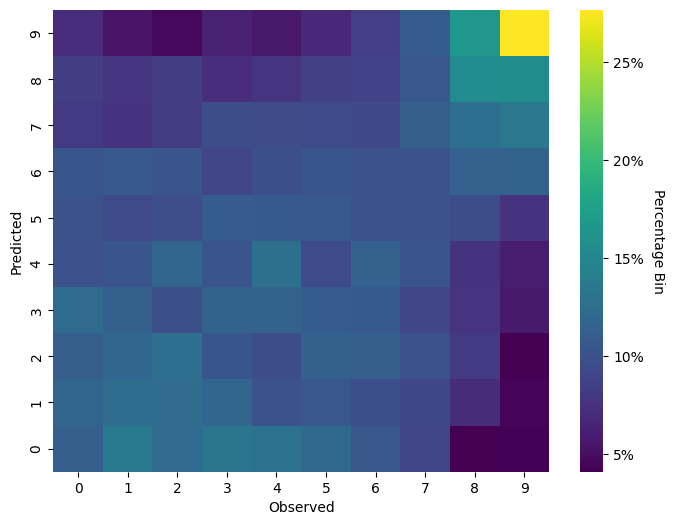

In [36]:
# Heatmap of TSSs dataset (fig 1) predictions (with inactive variants)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.saving import load_model  # type: ignore
import seaborn as sns
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import MinMaxScaler

from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import wasserstein_distance

# -------------------- Data Preprocessing Functions --------------------

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

def padded_one_hot_encode(sequence):
    mapping = {'A': [1, 0, 0, 0], 'C': [0, 1, 0, 0], 'G': [0, 0, 1, 0], 'T': [0, 0, 0, 1], '0': [0, 0, 0, 0]}
    return np.array([mapping[nucleotide.upper()] for nucleotide in sequence])

model = load_model('Models/CNN_6_1_2.keras')

df = pd.read_csv('Data/Urtecho_2023_rLP5_Endo2_lb_expression_formatted_std.csv')

# Group the data by condition
X_test = df['variant']
y_test = df['expn_med_fitted_scaled']

y_pred = model.predict(preprocess_sequences(X_test)).flatten()

qt = QuantileTransformer(output_distribution='uniform')
y_test_q = qt.fit_transform(np.array(y_test).reshape(-1, 1)).flatten()
y_pred_q = qt.fit_transform(np.array(y_pred).reshape(-1, 1)).flatten()

# Create a 2D histogram / contingency table for binned data
bins = np.linspace(0, 1, 11)
y_test_bins = np.digitize(y_test_q, bins) - 1
y_pred_bins = np.digitize(y_pred_q, bins) - 1
y_test_bins = np.clip(y_test_bins, 0, 9)
y_pred_bins = np.clip(y_pred_bins, 0, 9)

# Compute percentages for each bin, from 0-100%
bin_counts = pd.crosstab(y_pred_bins, y_test_bins)
bin_percentages = bin_counts.div(bin_counts.sum(axis=0), axis=1) * 100

# Plot heatmap and capture the Axes object
plt.figure(figsize=(8, 6))
ax = sns.heatmap(bin_percentages, cmap="viridis", annot=False)

# Customize the existing colorbar
colorbar = ax.collections[0].colorbar
colorbar.set_label('Percentage Bin', rotation=270, labelpad=15)
colorbar.set_ticks([i for i in range(5, 30, 5)])
colorbar.set_ticklabels([f"{int(x)}%" for x in colorbar.get_ticks()])

plt.xlabel("Observed")
plt.ylabel("Predicted")
plt.gca().invert_yaxis()
plt.show()

87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
469/469 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


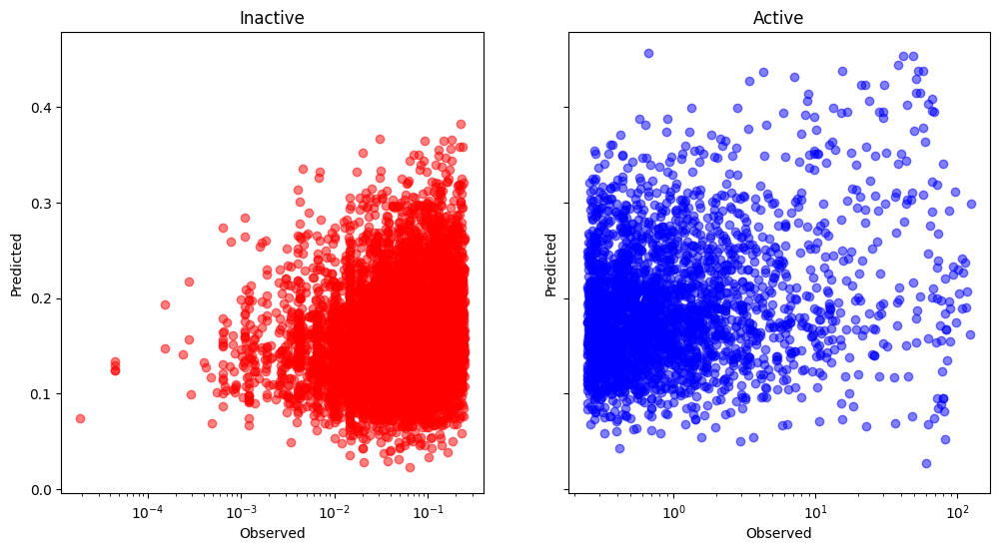

In [53]:
# Scatter plot for active/inactive promoter predictions sourced from aggregated TSSs dataset (fig 1)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.saving import load_model  # type: ignore
import seaborn as sns
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import MinMaxScaler

from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import wasserstein_distance

# -------------------- Data Preprocessing Functions --------------------

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

def padded_one_hot_encode(sequence):
    mapping = {'A': [1, 0, 0, 0], 'C': [0, 1, 0, 0], 'G': [0, 0, 1, 0], 'T': [0, 0, 0, 1], '0': [0, 0, 0, 0]}
    return np.array([mapping[nucleotide.upper()] for nucleotide in sequence])

model = load_model('Models/CNN_6_1_2.keras')

df = pd.read_csv('Data/Urtecho_2023_rLP5_Endo2_lb_expression_formatted_std.csv')
df_active = df[df['active'] == 'active'].copy()
df_inactive = df[df['active'] == 'inactive'].copy()

# Group the data by condition
X_test_active = df_active['variant']
y_test_active = df_active['expn_med_fitted_scaled']

X_test_inactive = df_inactive['variant']
y_test_inactive = df_inactive['expn_med_fitted_scaled']

y_pred_active = model.predict(preprocess_sequences(X_test_active)).flatten()
y_pred_inactive = model.predict(preprocess_sequences(X_test_inactive)).flatten()

# make a scatter plot between y_test_active and y_pred
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)
axes[0].scatter(y_test_inactive, y_pred_inactive, alpha=0.5, color='red')
axes[0].set_title('Inactive')
axes[0].set_xlabel('Observed')
axes[0].set_ylabel('Predicted')
axes[0].set_xscale('log')

axes[1].scatter(y_test_active, y_pred_active, alpha=0.5, color='blue')
axes[1].set_title('Active')
axes[1].set_xlabel('Observed')
axes[1].set_ylabel('Predicted')
axes[1].set_xscale('log')

plt.show()

87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
469/469 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


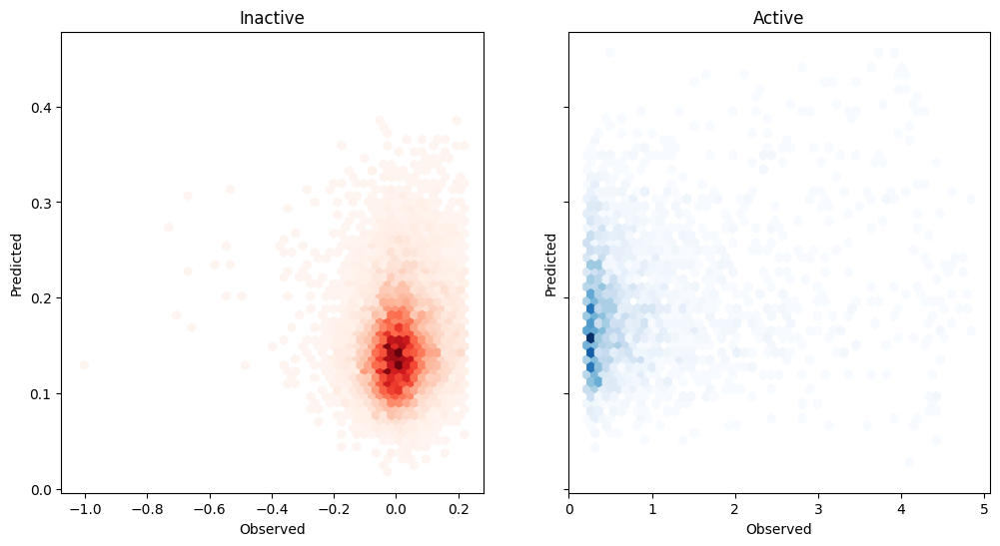

In [56]:
# Scatter plot for active/inactive promoter predictions sourced from aggregated TSSs dataset (fig 1)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.saving import load_model  # type: ignore
import seaborn as sns
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import MinMaxScaler

from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import wasserstein_distance

# -------------------- Data Preprocessing Functions --------------------

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

def padded_one_hot_encode(sequence):
    mapping = {'A': [1, 0, 0, 0], 'C': [0, 1, 0, 0], 'G': [0, 0, 1, 0], 'T': [0, 0, 0, 1], '0': [0, 0, 0, 0]}
    return np.array([mapping[nucleotide.upper()] for nucleotide in sequence])

model = load_model('Models/CNN_6_1_2.keras')

df = pd.read_csv('Data/Urtecho_2023_rLP5_Endo2_lb_expression_formatted_std.csv')
df['log_expn_med_fitted_scaled'] = np.log1p(df['expn_med_fitted_scaled'])

df_active = df[df['active'] == 'active'].copy()
df_inactive = df[df['active'] == 'inactive'].copy()

# Group the data by condition
X_test_active = df_active['variant']
y_test_active = df_active['log_expn_med_fitted_scaled']

X_test_inactive = df_inactive['variant']
y_test_inactive = df_inactive['log_expn_med_fitted_scaled']

y_pred_active = model.predict(preprocess_sequences(X_test_active)).flatten()
y_pred_inactive = model.predict(preprocess_sequences(X_test_inactive)).flatten()

# make a scatter plot between y_test_active and y_pred
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

axes[0].hexbin(y_test_inactive, y_pred_inactive, gridsize=50, cmap='Reds', mincnt=1)
axes[0].set_title('Inactive')
axes[0].set_xlabel('Observed')
axes[0].set_ylabel('Predicted')
# axes[0].set_xscale('log')

axes[1].hexbin(y_test_active, y_pred_active, gridsize=50, cmap='Blues', mincnt=1)
axes[1].set_title('Active')
axes[1].set_xlabel('Observed')
axes[1].set_ylabel('Predicted')
# axes[1].set_xscale('log')

plt.show()

87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
469/469 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


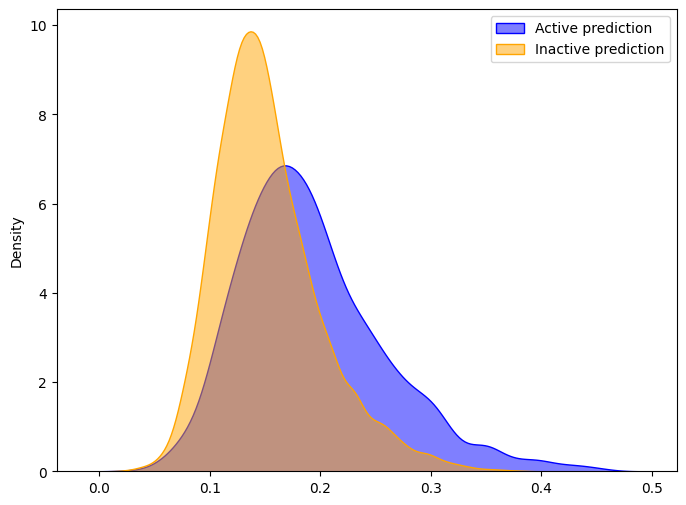

In [34]:
# Distribution of active/inactive promoter predictions sourced from aggregated TSSs dataset (fig 1)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from keras.saving import load_model  # type: ignore
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import MinMaxScaler

from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import wasserstein_distance

# -------------------- Data Preprocessing Functions --------------------

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

def padded_one_hot_encode(sequence):
    mapping = {'A': [1, 0, 0, 0], 'C': [0, 1, 0, 0], 'G': [0, 0, 1, 0], 'T': [0, 0, 0, 1], '0': [0, 0, 0, 0]}
    return np.array([mapping[nucleotide.upper()] for nucleotide in sequence])

model = load_model('Models/CNN_6_1_2.keras')

df = pd.read_csv('Data/Urtecho_2023_rLP5_Endo2_lb_expression_formatted_std.csv')
df['active'].apply(lambda x: 1 if x == 'active' else 0)
df_active = df[df['active'] == 'active'].copy()
df_inactive = df[df['active'] == 'inactive'].copy()


# Group the data by condition
X_test_active = df_active['variant']
y_test_active = df_active['active']

X_test_inactive = df_inactive['variant']
y_test_inactive = df_inactive['active']

y_pred_active = model.predict(preprocess_sequences(X_test_active)).flatten()
y_pred_inactive = model.predict(preprocess_sequences(X_test_inactive)).flatten()

# plot the kde of y_test for active and inactive
plt.figure(figsize=(8, 6))
sns.kdeplot(y_pred_active, alpha=0.5, label='Active prediction', color='blue', fill=True)
sns.kdeplot(y_pred_inactive, alpha=0.5, label='Inactive prediction', color='orange', fill=True)
plt.legend()
plt.show()


1460/1460 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step


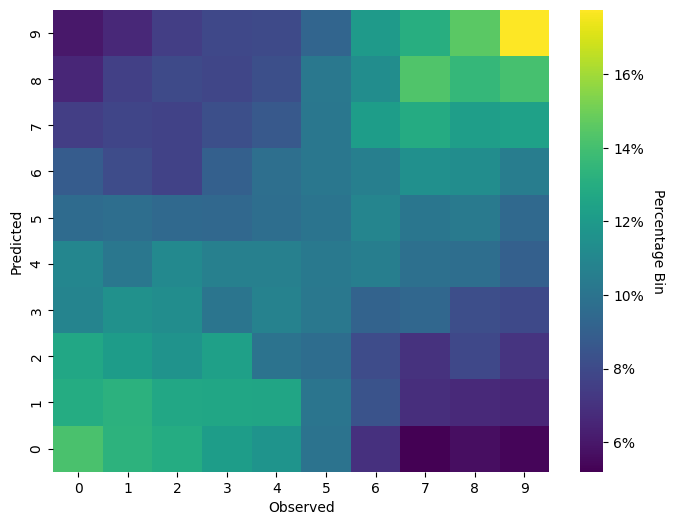

In [44]:
# Fragment data

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.saving import load_model  # type: ignore
import seaborn as sns
from sklearn.preprocessing import QuantileTransformer

from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import wasserstein_distance

# -------------------- Data Preprocessing Functions --------------------

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

def padded_one_hot_encode(sequence):
    mapping = {'A': [1, 0, 0, 0], 'C': [0, 1, 0, 0], 'G': [0, 0, 1, 0], 'T': [0, 0, 0, 1], '0': [0, 0, 0, 0]}
    return np.array([mapping[nucleotide.upper()] for nucleotide in sequence])

model = load_model('Models/CNN_6_1_2.keras')

df = pd.read_csv('Data/Urtecho_2023_peak_tile_expression_formatted_std.csv')

# Group the data by condition
X_test = df['variant']
y_test = df['expn_med_fitted_scaled']

y_pred = model.predict(preprocess_sequences(X_test)).flatten()

qt = QuantileTransformer(output_distribution='uniform')
y_test_q = qt.fit_transform(np.array(y_test).reshape(-1, 1)).flatten()
y_pred_q = qt.fit_transform(np.array(y_pred).reshape(-1, 1)).flatten()

# Create a 2D histogram / contingency table for binned data
bins = np.linspace(0, 1, 11)
y_test_bins = np.digitize(y_test_q, bins) - 1
y_pred_bins = np.digitize(y_pred_q, bins) - 1
y_test_bins = np.clip(y_test_bins, 0, 9)
y_pred_bins = np.clip(y_pred_bins, 0, 9)

# Compute percentages for each bin, from 0-100%
bin_counts = pd.crosstab(y_pred_bins, y_test_bins)
bin_percentages = bin_counts.div(bin_counts.sum(axis=0), axis=1) * 100

# Plot heatmap and capture the Axes object
plt.figure(figsize=(8, 6))
ax = sns.heatmap(bin_percentages, cmap="viridis", annot=False)

# Customize the existing colorbar
colorbar = ax.collections[0].colorbar
colorbar.set_label('Percentage Bin', rotation=270, labelpad=15)
colorbar.set_ticks([i for i in range(6, 17, 2)])
colorbar.set_ticklabels([f"{int(x)}%" for x in colorbar.get_ticks()])

plt.xlabel("Observed")
plt.ylabel("Predicted")
plt.gca().invert_yaxis()
plt.show()

181/181 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


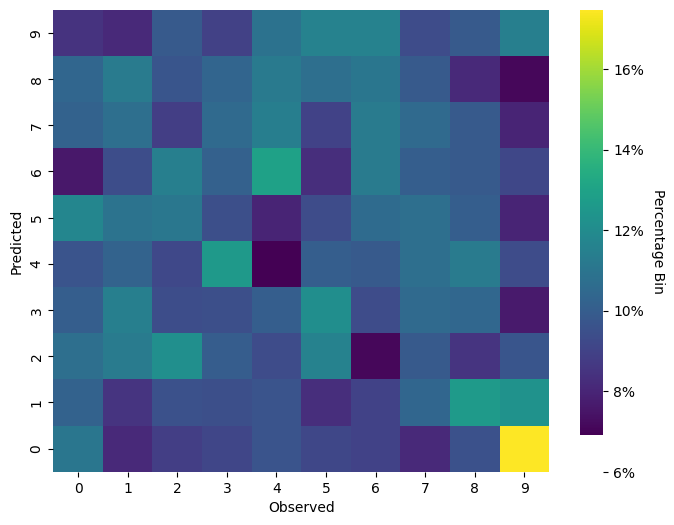

In [58]:
# Fragment data, no inactive variants

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.saving import load_model  # type: ignore
import seaborn as sns
from sklearn.preprocessing import QuantileTransformer

from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import wasserstein_distance

# -------------------- Data Preprocessing Functions --------------------

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

def padded_one_hot_encode(sequence):
    mapping = {'A': [1, 0, 0, 0], 'C': [0, 1, 0, 0], 'G': [0, 0, 1, 0], 'T': [0, 0, 0, 1], '0': [0, 0, 0, 0]}
    return np.array([mapping[nucleotide.upper()] for nucleotide in sequence])

model = load_model('Models/CNN_6_1_2.keras')

df = pd.read_csv('Data/Urtecho_2023_peak_tile_expression_formatted_std.csv')
df = df[df['active'] != 'inactive'].copy()

# Group the data by condition
X_test = df['variant']
y_test = df['expn_med_fitted_scaled']

y_pred = model.predict(preprocess_sequences(X_test)).flatten()

qt = QuantileTransformer(output_distribution='uniform')
y_test_q = qt.fit_transform(np.array(y_test).reshape(-1, 1)).flatten()
y_pred_q = qt.fit_transform(np.array(y_pred).reshape(-1, 1)).flatten()

# Create a 2D histogram / contingency table for binned data
bins = np.linspace(0, 1, 11)
y_test_bins = np.digitize(y_test_q, bins) - 1
y_pred_bins = np.digitize(y_pred_q, bins) - 1
y_test_bins = np.clip(y_test_bins, 0, 9)
y_pred_bins = np.clip(y_pred_bins, 0, 9)

# Compute percentages for each bin, from 0-100%
bin_counts = pd.crosstab(y_pred_bins, y_test_bins)
bin_percentages = bin_counts.div(bin_counts.sum(axis=0), axis=1) * 100

# Plot heatmap and capture the Axes object
plt.figure(figsize=(8, 6))
ax = sns.heatmap(bin_percentages, cmap="viridis", annot=False)

# Customize the existing colorbar
colorbar = ax.collections[0].colorbar
colorbar.set_label('Percentage Bin', rotation=270, labelpad=15)
colorbar.set_ticks([i for i in range(6, 17, 2)])
colorbar.set_ticklabels([f"{int(x)}%" for x in colorbar.get_ticks()])

plt.xlabel("Observed")
plt.ylabel("Predicted")
plt.gca().invert_yaxis()
plt.show()

181/181 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step


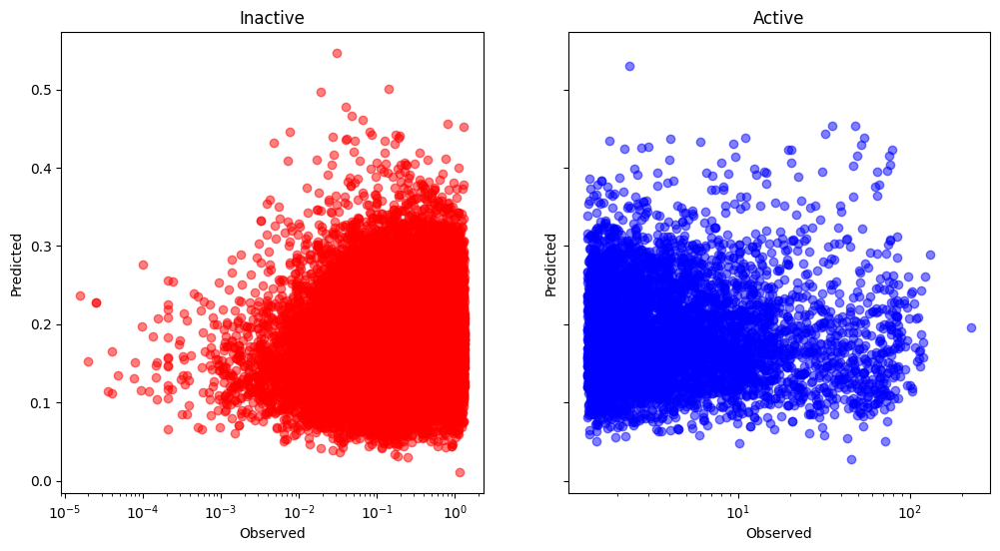

In [52]:
# Scatter plot for active/inactive promoter predictions sourced from fragments

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.saving import load_model  # type: ignore
import seaborn as sns
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import MinMaxScaler

from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import wasserstein_distance

# -------------------- Data Preprocessing Functions --------------------

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

def padded_one_hot_encode(sequence):
    mapping = {'A': [1, 0, 0, 0], 'C': [0, 1, 0, 0], 'G': [0, 0, 1, 0], 'T': [0, 0, 0, 1], '0': [0, 0, 0, 0]}
    return np.array([mapping[nucleotide.upper()] for nucleotide in sequence])

model = load_model('Models/CNN_6_1_2.keras')

df = pd.read_csv('Data/Urtecho_2023_peak_tile_expression_formatted_std.csv')

df_active = df[df['active'] == 'active'].copy()
df_inactive = df[df['active'] == 'inactive'].copy()

# Group the data by condition
X_test_active = df_active['variant']
y_test_active = df_active['expn_med_fitted_scaled']

X_test_inactive = df_inactive['variant']
y_test_inactive = df_inactive['expn_med_fitted_scaled']

y_pred_active = model.predict(preprocess_sequences(X_test_active)).flatten()
y_pred_inactive = model.predict(preprocess_sequences(X_test_inactive)).flatten()

# make a scatter plot between y_test_active and y_pred
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)
axes[0].scatter(y_test_inactive, y_pred_inactive, alpha=0.5, color='red')
axes[0].set_title('Inactive')
axes[0].set_xlabel('Observed')
axes[0].set_ylabel('Predicted')
axes[0].set_xscale('log')

axes[1].scatter(y_test_active, y_pred_active, alpha=0.5, color='blue')
axes[1].set_title('Active')
axes[1].set_xlabel('Observed')
axes[1].set_ylabel('Predicted')
axes[1].set_xscale('log')

plt.show()

181/181 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1279/1279 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


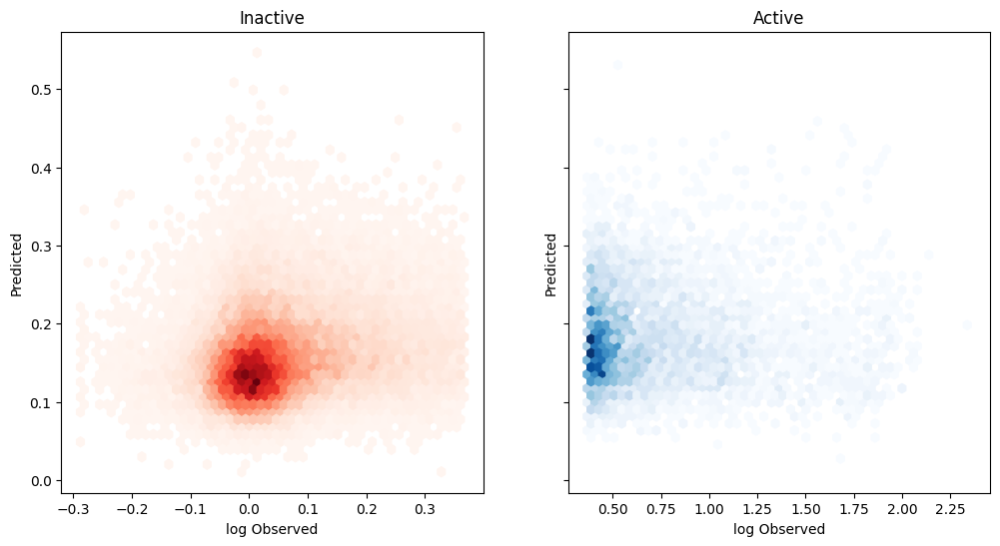

In [62]:
# Scatter plot for active/inactive promoter predictions sourced from fragments

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.saving import load_model  # type: ignore
import seaborn as sns
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import MinMaxScaler

from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import wasserstein_distance

# -------------------- Data Preprocessing Functions --------------------

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

def padded_one_hot_encode(sequence):
    mapping = {'A': [1, 0, 0, 0], 'C': [0, 1, 0, 0], 'G': [0, 0, 1, 0], 'T': [0, 0, 0, 1], '0': [0, 0, 0, 0]}
    return np.array([mapping[nucleotide.upper()] for nucleotide in sequence])

model = load_model('Models/CNN_6_1_2.keras')

df = pd.read_csv('Data/Urtecho_2023_peak_tile_expression_formatted_std.csv')
df['log_expn_med_fitted_scaled'] = np.log10(df['expn_med_fitted_scaled']+1)

df_active = df[df['active'] == 'active'].copy()
df_inactive = df[df['active'] == 'inactive'].copy()

# Group the data by condition
X_test_active = df_active['variant']
y_test_active = df_active['log_expn_med_fitted_scaled']

X_test_inactive = df_inactive['variant']
y_test_inactive = df_inactive['log_expn_med_fitted_scaled']

y_pred_active = model.predict(preprocess_sequences(X_test_active)).flatten()
y_pred_inactive = model.predict(preprocess_sequences(X_test_inactive)).flatten()

# make a scatter plot between y_test_active and y_pred
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

axes[0].hexbin(y_test_inactive, y_pred_inactive, gridsize=50, cmap='Reds', mincnt=1)
axes[0].set_title('Inactive')
axes[0].set_xlabel('log Observed')
axes[0].set_ylabel('Predicted')

axes[1].hexbin(y_test_active, y_pred_active, gridsize=50, cmap='Blues', mincnt=1)
axes[1].set_title('Active')
axes[1].set_xlabel('log Observed')
axes[1].set_ylabel('Predicted')

plt.show()

1460/1460 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step


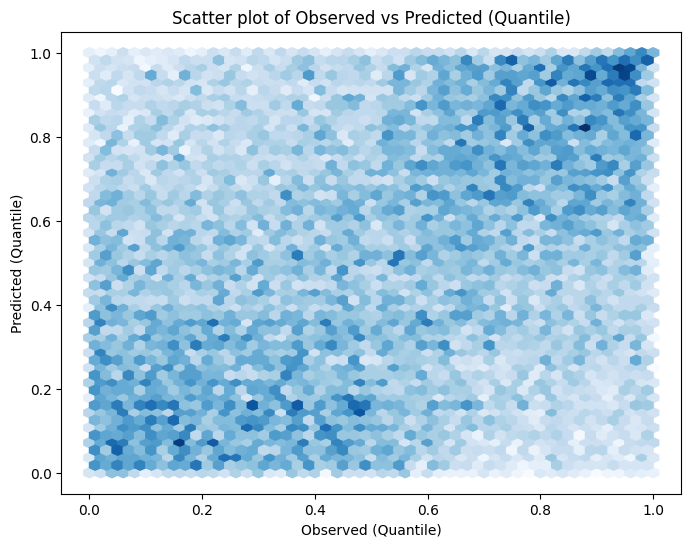

In [65]:
# Fragment data

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.saving import load_model  # type: ignore
import seaborn as sns
from sklearn.preprocessing import QuantileTransformer

from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import wasserstein_distance

# -------------------- Data Preprocessing Functions --------------------

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

def padded_one_hot_encode(sequence):
    mapping = {'A': [1, 0, 0, 0], 'C': [0, 1, 0, 0], 'G': [0, 0, 1, 0], 'T': [0, 0, 0, 1], '0': [0, 0, 0, 0]}
    return np.array([mapping[nucleotide.upper()] for nucleotide in sequence])

model = load_model('Models/CNN_6_1_2.keras')

df = pd.read_csv('Data/Urtecho_2023_peak_tile_expression_formatted_std.csv')

# Group the data by condition
X_test = df['variant']
y_test = df['expn_med_fitted_scaled']

y_pred = model.predict(preprocess_sequences(X_test)).flatten()

qt = QuantileTransformer(output_distribution='uniform')
y_test_q = qt.fit_transform(np.array(y_test).reshape(-1, 1)).flatten()
y_pred_q = qt.fit_transform(np.array(y_pred).reshape(-1, 1)).flatten()


# plot a hexbin plot between y_test_q and y_pred_q
plt.figure(figsize=(8, 6))
plt.hexbin(y_test_q, y_pred_q, gridsize=50, cmap='Blues', mincnt=1)
plt.xlabel('Observed (Quantile)')
plt.ylabel('Predicted (Quantile)')
plt.title('Scatter plot of Observed vs Predicted (Quantile)')
plt.show()

1460/1460 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step


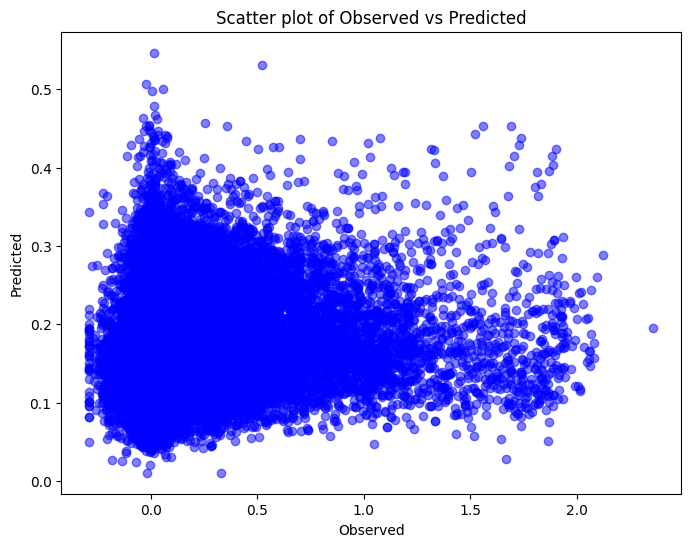

In [71]:
# Fragment data

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.saving import load_model  # type: ignore
import seaborn as sns
from sklearn.preprocessing import QuantileTransformer

from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import wasserstein_distance

# -------------------- Data Preprocessing Functions --------------------

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

def padded_one_hot_encode(sequence):
    mapping = {'A': [1, 0, 0, 0], 'C': [0, 1, 0, 0], 'G': [0, 0, 1, 0], 'T': [0, 0, 0, 1], '0': [0, 0, 0, 0]}
    return np.array([mapping[nucleotide.upper()] for nucleotide in sequence])

model = load_model('Models/CNN_6_1_2.keras')

df = pd.read_csv('Data/Urtecho_2023_peak_tile_expression_formatted_std.csv')

# Group the data by condition
X_test = df['variant']
y_test = df['expn_med_fitted_scaled'].apply(lambda x: np.log10(x+1))

y_pred = model.predict(preprocess_sequences(X_test)).flatten()

# plot a hexbin plot between y_test_q and y_pred_q
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.5, color='blue')
plt.xlabel('Observed')
plt.ylabel('Predicted')
plt.title('Scatter plot of Observed vs Predicted')
plt.show()

3744/3744 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step


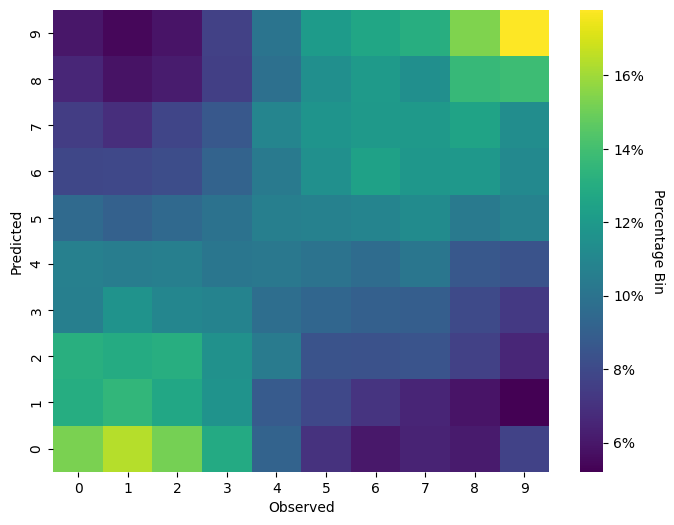

In [59]:
# Urtecho et al model training data

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.saving import load_model  # type: ignore
import seaborn as sns
from sklearn.preprocessing import QuantileTransformer

from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import wasserstein_distance

# -------------------- Data Preprocessing Functions --------------------

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

def padded_one_hot_encode(sequence):
    mapping = {'A': [1, 0, 0, 0], 'C': [0, 1, 0, 0], 'G': [0, 0, 1, 0], 'T': [0, 0, 0, 1], '0': [0, 0, 0, 0]}
    return np.array([mapping[nucleotide.upper()] for nucleotide in sequence])

model = load_model('Models/CNN_6_1_2.keras')

df = pd.read_csv('Data/Urtecho_2023_tss_scramble_peak.csv')

# Group the data by condition
X_test = df['promoter_sequence']
y_test = df['expression']

y_pred = model.predict(preprocess_sequences(X_test)).flatten()

qt = QuantileTransformer(output_distribution='uniform')
y_test_q = qt.fit_transform(np.array(y_test).reshape(-1, 1)).flatten()
y_pred_q = qt.fit_transform(np.array(y_pred).reshape(-1, 1)).flatten()

# Create a 2D histogram / contingency table for binned data
bins = np.linspace(0, 1, 11)
y_test_bins = np.digitize(y_test_q, bins) - 1
y_pred_bins = np.digitize(y_pred_q, bins) - 1
y_test_bins = np.clip(y_test_bins, 0, 9)
y_pred_bins = np.clip(y_pred_bins, 0, 9)

# Compute percentages for each bin, from 0-100%
bin_counts = pd.crosstab(y_pred_bins, y_test_bins)
bin_percentages = bin_counts.div(bin_counts.sum(axis=0), axis=1) * 100

# Plot heatmap and capture the Axes object
plt.figure(figsize=(8, 6))
ax = sns.heatmap(bin_percentages, cmap="viridis", annot=False)

# Customize the existing colorbar
colorbar = ax.collections[0].colorbar
colorbar.set_label('Percentage Bin', rotation=270, labelpad=15)
colorbar.set_ticks([i for i in range(6, 17, 2)])
colorbar.set_ticklabels([f"{int(x)}%" for x in colorbar.get_ticks()])

plt.xlabel("Observed")
plt.ylabel("Predicted")
plt.gca().invert_yaxis()
plt.show()

c:\Users\rsore\anaconda3\envs\TX_prediction\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 34 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


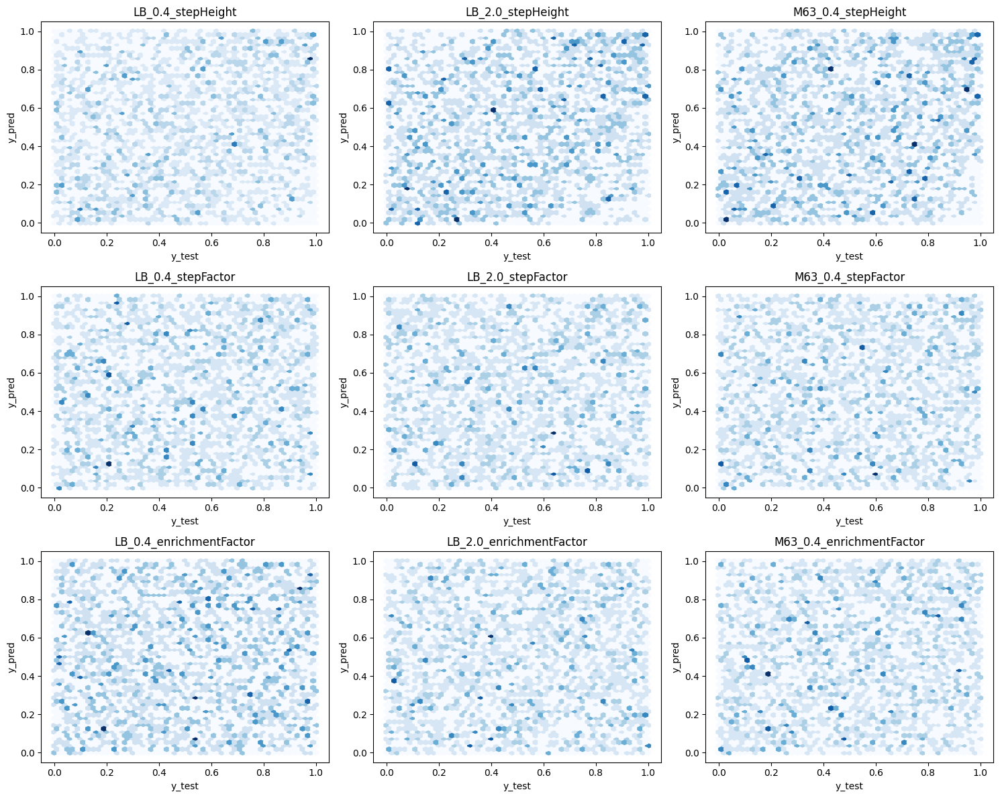

In [ ]:
# Thomasan et al data

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.saving import load_model  # type: ignore
import seaborn as sns
from sklearn.preprocessing import QuantileTransformer

# -------------------- Data Preprocessing Functions --------------------

def preprocess_sequences(X, max_length=150):
    return np.array([padded_one_hot_encode(seq.zfill(max_length)) for seq in X])

def padded_one_hot_encode(sequence):
    mapping = {'A': [1, 0, 0, 0], 'C': [0, 1, 0, 0], 'G': [0, 0, 1, 0], 'T': [0, 0, 0, 1], '0': [0, 0, 0, 0]}
    return np.array([mapping[nucleotide.upper()] for nucleotide in sequence])

# Load model and data
model = load_model('Models/CNN_6_1_2.keras')
df = pd.read_csv('Data/Thomasan.csv')

# Remove boolean columns
df = df.drop(columns=['LB_0.4_detected', 'LB_2.0_detected', 'M63_0.4_detected', 'LB_0.4_enriched', 'LB_2.0_enriched', 'M63_0.4_enriched'])

# Remove any row with a value of 100.0 or 0
df = df[((df != 100.0) & (df != 0)).all(axis=1)]

# Extract sequences
X_test = df['Sequence']
X_encoded = preprocess_sequences(X_test)

# Predict once
y_pred = model.predict(X_encoded).flatten()

# Quantile transform predicted values
qt_pred = QuantileTransformer(output_distribution='uniform')
y_pred_q = qt_pred.fit_transform(y_pred.reshape(-1, 1)).flatten()

# Set up subplot grid
columns_to_compare = df.columns[1:]
n_cols = 3
n_rows = int(np.ceil(len(columns_to_compare) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()

for i, col in enumerate(columns_to_compare):
    y_test = df[col].values
    qt_test = QuantileTransformer(output_distribution='uniform')
    y_test_q = qt_test.fit_transform(y_test.reshape(-1, 1)).flatten()

    # graph y_test vs y_pred
    axes[i].hexbin(y_test_q, y_pred_q, gridsize=50, cmap='Blues')
    axes[i].set_title(col)
    axes[i].set_xlabel('y_test')
    axes[i].set_ylabel('y_pred')


# Remove extra subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()

# plt.savefig('Figures/Figure 6 (Thomasan).pdf', dpi=300, bbox_inches='tight')

plt.show()


### Table 1
-----

In [12]:
import pandas as pd
import numpy as np

df = pd.read_csv('Data/repeat_evalute_each_file.csv', index_col=0)

file_names = []
cv_self = []
cv_all = []

for i in range(0, len(df.columns), 2):
    col_self = df.columns[i]
    col_all = df.columns[i+1]
    file_name = col_self.replace(' (Self)', '')

    self_values = df[col_self]
    all_values = df[col_all]

    cv_s = self_values.std() / self_values.mean() if not self_values.empty else None
    cv_a = all_values.std() / all_values.mean() if not all_values.empty else None

    file_names.append(file_name)
    cv_self.append(cv_s)
    cv_all.append(cv_a)

cv_df = pd.DataFrame({
    "File Name": file_names,
    "Coefficient of Variation (Self)": cv_self,
    "Coefficient of Variation (All)": cv_all
})

# Merge with file name counts
file_name_counts = pd.read_csv('Data/LaFleur_supp.csv')['File Name'].value_counts()
cv_df = cv_df.merge(file_name_counts.rename_axis('File Name').reset_index(), on='File Name')

# Rename, reorder columns
cv_df.rename(columns={'File Name' : 'Dataset', 'count': 'Dataset Size'}, inplace=True)
cv_df = cv_df[['Dataset', 'Dataset Size', 'Coefficient of Variation (Self)', 'Coefficient of Variation (All)']]

# Save the DataFrame to a CSV file
# cv_df.to_csv('Figures/Table 1.csv', index=False)

cv_df.head(None)

,Dataset,Dataset Size,Coefficient of Variation (Self),Coefficient of Variation (All)
0,La Fleur et al,5391,0.076679,0.239368
1,Urtecho et al,10898,0.173692,0.181598
2,Hossain et al,4350,0.056597,0.179277
3,Yu et al,1493,0.271977,0.177044
4,Lagator et al 36N,11485,0.028094,0.114040
5,Lagator et al Pl,2903,0.128979,0.144480
6,Lagator et al Pr,12194,0.042061,0.206683
7,Anderson et al,18,0.306292,0.295497
8,De Novo Designs,35,0.368906,0.138857


# Supplementary Figures

### Figure S1 (A - D)
-----

In [14]:
df = pd.read_csv('Data/CNN_file_metrics.csv')
df.head()

,File Name,Training Data CV,All Data CV,Training Data MSE Averages,All Data MSE Averages,Sequence Count,Average Sequence Length,Sequence Lengths,Observed Expression,Average Observed Expression,Within-File Entropy,Average Pairwise Distance,Within-File Hamming Distance
0,La Fleur et al,0.072744,0.227085,0.000894,0.095725,5391,73.86496,"[74, 74, 74, 74, 74, 73, 73, 73, 73, 73, 74, 7...","[-3.386326274, -3.392439032, -3.698902914, -3....",-2.638173,0.732649,61.819662,25.173317
1,Urtecho et al,0.164779,0.172279,0.000367,0.033381,10898,150.00000,"[150, 150, 150, 150, 150, 150, 150, 150, 150, ...","[-1.046079556, -1.431813084, -1.098599732, -1....",-1.903470,1.513936,96.575047,86.719749
2,Yu et al,0.258020,0.167959,0.001616,0.332792,1493,150.00000,"[150, 150, 150, 150, 150, 150, 150, 150, 150, ...","[-2.416324554, -1.69328491, -1.428471584, -4.2...",-2.598650,0.352242,71.581423,21.625176
3,Lagator et al Pr,0.039902,0.196077,0.001881,0.072140,12194,139.00000,"[139, 139, 139, 139, 139, 139, 139, 139, 139, ...","[-6.133261487, -6.08031203, -5.798335905, -5.1...",-5.421390,0.375852,64.010426,16.272864
4,Lagator et al 36N,0.026652,0.108187,0.002698,0.117030,11485,116.00000,"[116, 116, 116, 116, 116, 116, 116, 116, 116, ...","[-6.023111372, -6.067880909, -3.65581588, -6.2...",-4.131152,0.614703,67.810115,26.777638


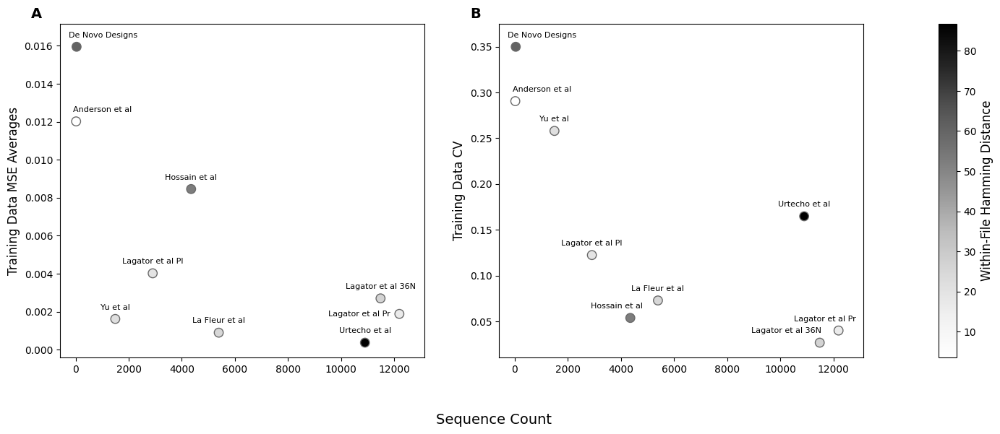

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib import cm, colors as mcolors

def adjust_text_pos(idx, x, y, y_offset, label):
    custom_offsets = {
        ('De Novo Designs', None): (1000, 0),
        ('Anderson et al', None): (1000, 0),
        ('Lagator et al Pr', 0): (-1500, -y_offset * 1.5),
        ('Lagator et al Pr', 1): (-500, 0),
        ('Hossain et al', 1): (-500, 0),
        ('Lagator et al 36N', 1): (-1250, 0),
    }
    dx, dy = custom_offsets.get((label, idx)) or custom_offsets.get((label, None), (0, 0))
    return x + dx, y + dy

# Load data
df = pd.read_csv('Data/CNN_file_metrics.csv')

# Setup figure and axes
fig = plt.figure(figsize=(16, 6))
gs = GridSpec(1, 3, width_ratios=[1, 1, 0.05], wspace=0.3)
axes = [fig.add_subplot(gs[0, i]) for i in range(2)]

# Setup colormap normalization
color_col = 'Within-File Hamming Distance'
norm = mcolors.Normalize(vmin=df[color_col].min(), vmax=df[color_col].max())
cmap = cm.Greys

x_col = 'Sequence Count'
y_cols = ['Training Data MSE Averages', 'Training Data CV']

# Plot scatter plots
for idx, (ax, y_col) in enumerate(zip(axes, y_cols)):
    scatter = ax.scatter(
        df[x_col],
        df[y_col],
        c=df[color_col],
        cmap=cmap,
        edgecolor='dimgrey',
        s=80
    )

    # Adjust text annotations
    x_offset = (ax.get_xlim()[1] - ax.get_xlim()[0]) * 0.025
    y_offset = (ax.get_ylim()[1] - ax.get_ylim()[0]) * 0.025

    for _, row in df.iterrows():
        x, y = row[x_col], row[y_col] + y_offset
        label = row['File Name']
        adj_x, adj_y = adjust_text_pos(idx, x, y, y_offset, label)
        ax.text(adj_x, adj_y, label, fontsize=8, ha='center', va='bottom')

    ax.set_xlim(ax.get_xlim()[0], ax.get_xlim()[1] + x_offset)
    ax.set_ylim(ax.get_ylim()[0], ax.get_ylim()[1] + y_offset)
    ax.set_ylabel(y_col, fontsize=12)
    ax.text(-0.05, 1.05, chr(65 + idx), transform=ax.transAxes,
            ha='right', va='top', fontsize=14, fontweight='bold')

cbar_ax = fig.add_subplot(gs[0, 2])
fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax).set_label(color_col, fontsize=12)
fig.supxlabel(x_col, fontsize=14, y=-0.05)

# Show and save figure
plt.show()
# fig.savefig('Figures/Figure S1.pdf', dpi=300, bbox_inches='tight')


C:\Users\rsore\AppData\Local\Temp\ipykernel_29160\1329404852.py:116: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


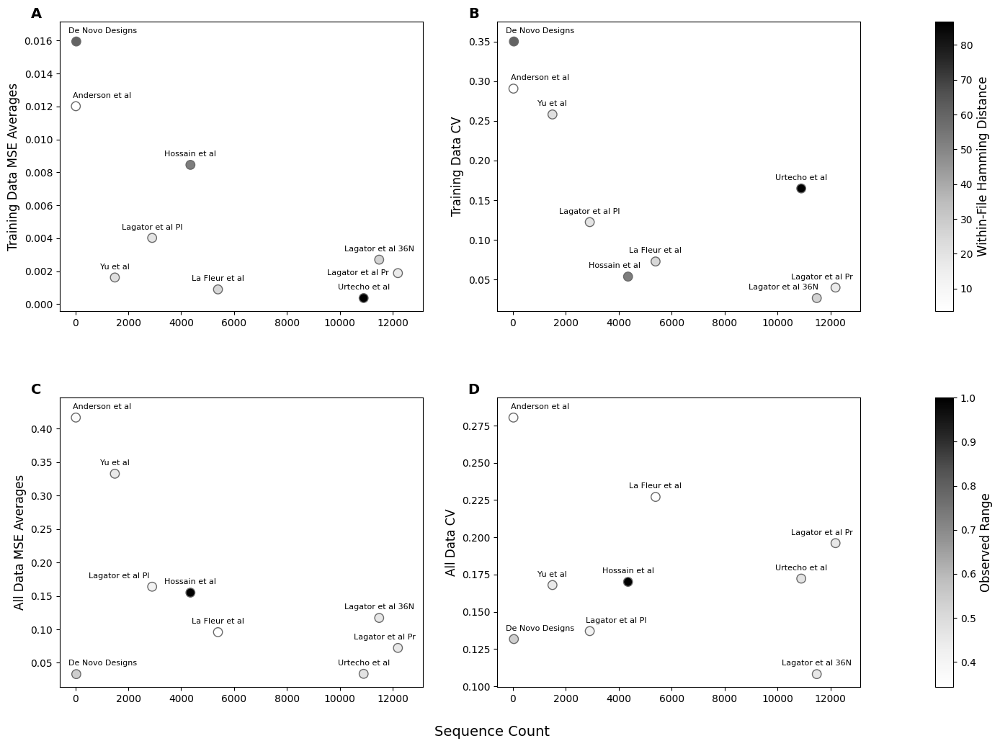

In [125]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib import cm, colors as mcolors
from sklearn.preprocessing import MinMaxScaler

# -------------------------- Helper Functions --------------------------

def adjust_text_pos_train(idx, x, y, y_offset, label):
    custom_offsets = {
        ('De Novo Designs', None): (1000, 0),
        ('Anderson et al', None): (1000, 0),
        ('Lagator et al Pr', 0): (-1500, -y_offset * 1.5),
        ('Lagator et al Pr', 1): (-500, 0),
        ('Hossain et al', 1): (-500, 0),
        ('Lagator et al 36N', 1): (-1250, 0),
    }
    dx, dy = custom_offsets.get((label, idx)) or custom_offsets.get((label, None), (0, 0))
    return x + dx, y + dy

def adjust_text_pos_test(idx, x, y, y_offset, label):
    custom_offsets = {
        ('De Novo Designs', None): (1000, 0),
        ('Anderson et al', None): (1000, 0),
        ('Lagator et al Pl', 0): (-1250, 0),
        ('Lagator et al Pl', 1): (1000, 0),
        ('Lagator et al Pr', None): (-500, 0),
    }
    dx, dy = custom_offsets.get((label, idx)) or custom_offsets.get((label, None), (0, 0))
    return x + dx, y + dy

# -------------------------- Load & Preprocess Data --------------------------

df = pd.read_csv('Data/CNN_file_metrics.csv')
df_LaFleur = pd.read_csv('Data/LaFleur_supp.csv')
df_LaFleur['Min-Max Observed'] = MinMaxScaler().fit_transform(
    df_LaFleur[['Observed log(TX/Txref)']].abs()
)
observed_range = (
    df_LaFleur.groupby('File Name')['Min-Max Observed']
    .agg(lambda x: x.max() - x.min())
    .reset_index()
    .rename(columns={'Min-Max Observed': 'Observed Range'})
)
df = df.merge(observed_range, on='File Name', how='left')

# -------------------------- Setup Figure --------------------------

fig = plt.figure(figsize=(16, 12))
gs = GridSpec(2, 3, width_ratios=[1, 1, 0.05], wspace=0.3, hspace=0.3)
axes = [fig.add_subplot(gs[i // 2, i % 2]) for i in range(4)]

# -------------------------- Plot Train --------------------------

train_y_cols = ['Training Data MSE Averages', 'Training Data CV']
train_color_col = 'Within-File Hamming Distance'
train_norm = mcolors.Normalize(vmin=df[train_color_col].min(), vmax=df[train_color_col].max())
cmap = cm.Greys
x_col = 'Sequence Count'

for idx, (ax, y_col) in enumerate(zip(axes[:2], train_y_cols)):
    scatter = ax.scatter(
        df[x_col],
        df[y_col],
        c=df[train_color_col],
        cmap=cmap,
        edgecolor='dimgrey',
        s=80
    )
    x_offset = (ax.get_xlim()[1] - ax.get_xlim()[0]) * 0.025
    y_offset = (ax.get_ylim()[1] - ax.get_ylim()[0]) * 0.025
    for _, row in df.iterrows():
        x, y = row[x_col], row[y_col] + y_offset
        label = row['File Name']
        adj_x, adj_y = adjust_text_pos_train(idx, x, y, y_offset, label)
        ax.text(adj_x, adj_y, label, fontsize=8, ha='center', va='bottom')
    ax.set_xlim(ax.get_xlim()[0], ax.get_xlim()[1] + x_offset)
    ax.set_ylim(ax.get_ylim()[0], ax.get_ylim()[1] + y_offset)
    ax.set_ylabel(y_col, fontsize=12)
    ax.text(-0.05, 1.05, chr(65 + idx), transform=ax.transAxes, ha='right', va='top', fontsize=14, fontweight='bold')

cbar_ax_train = fig.add_subplot(gs[0, 2])
fig.colorbar(cm.ScalarMappable(norm=train_norm, cmap=cmap), cax=cbar_ax_train).set_label(train_color_col, fontsize=12)

# -------------------------- Plot Test --------------------------

test_y_cols = ['All Data MSE Averages', 'All Data CV']
test_color_col = 'Observed Range'
test_norm = mcolors.Normalize(vmin=df[test_color_col].min(), vmax=df[test_color_col].max())

for idx, (ax, y_col) in enumerate(zip(axes[2:], test_y_cols)):
    scatter = ax.scatter(
        df[x_col],
        df[y_col],
        c=df[test_color_col],
        cmap=cmap,
        edgecolor='dimgrey',
        s=80
    )
    x_offset = (ax.get_xlim()[1] - ax.get_xlim()[0]) * 0.025
    y_offset = (ax.get_ylim()[1] - ax.get_ylim()[0]) * 0.025
    for _, row in df.iterrows():
        x, y = row[x_col], row[y_col] + y_offset
        label = row['File Name']
        adj_x, adj_y = adjust_text_pos_test(idx, x, y, y_offset, label)
        ax.text(adj_x, adj_y, label, fontsize=8, ha='center', va='bottom')
    ax.set_xlim(ax.get_xlim()[0], ax.get_xlim()[1] + x_offset)
    ax.set_ylim(ax.get_ylim()[0], ax.get_ylim()[1] + y_offset)
    ax.set_ylabel(y_col, fontsize=12)
    ax.text(-0.05, 1.05, chr(67 + idx), transform=ax.transAxes, ha='right', va='top', fontsize=14, fontweight='bold')

cbar_ax_test = fig.add_subplot(gs[1, 2])
fig.colorbar(cm.ScalarMappable(norm=test_norm, cmap=cmap), cax=cbar_ax_test).set_label(test_color_col, fontsize=12)

fig.supxlabel(x_col, fontsize=14, y=0.05)
plt.tight_layout()
plt.show()
# fig.savefig('Figures/Combined_2x2_Subplots.pdf', dpi=300, bbox_inches='tight')



### Figure S1E
-----

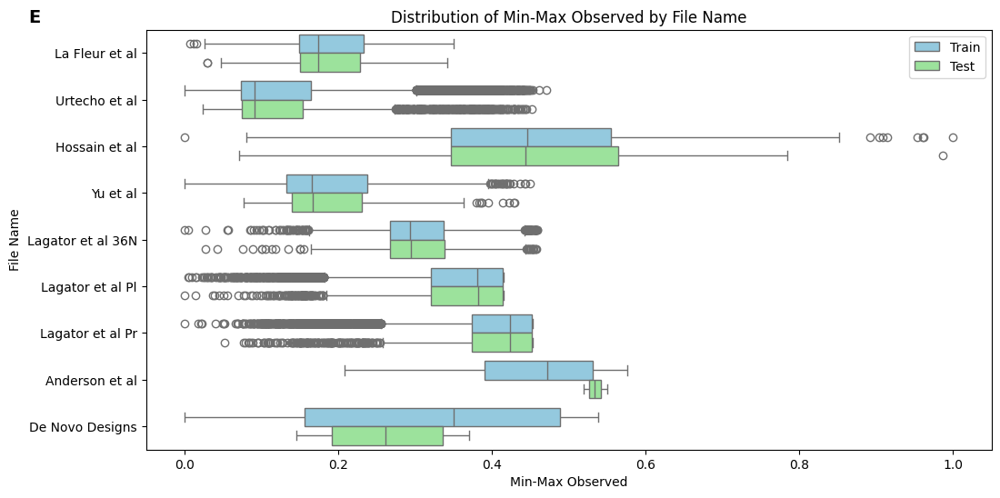

In [119]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Load and process data
df = pd.read_csv('Data/LaFleur_supp.csv')
df['Min-Max Observed'] = MinMaxScaler().fit_transform(df[['Observed log(TX/Txref)']].abs())

# Split into train/test
indices = np.arange(len(df))
train_idx, test_idx = train_test_split(indices, test_size=0.2, random_state=42)
df['Split'] = 'Train'
df.loc[test_idx, 'Split'] = 'Test'

# Plot
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='Min-Max Observed', y='File Name', hue='Split', palette={'Train': 'skyblue', 'Test': 'lightgreen'})

plt.title('Distribution of Min-Max Observed by File Name')
plt.xlabel('Min-Max Observed')
plt.ylabel('File Name')
plt.legend()

plt.text(-0.125, 1.05, 'E', transform=plt.gca().transAxes,
         ha='right', va='top', fontsize=14, fontweight='bold')

# Save figure
plt.savefig('Figures/FigureS1C.pdf', dpi=300, bbox_inches='tight')
plt.show()


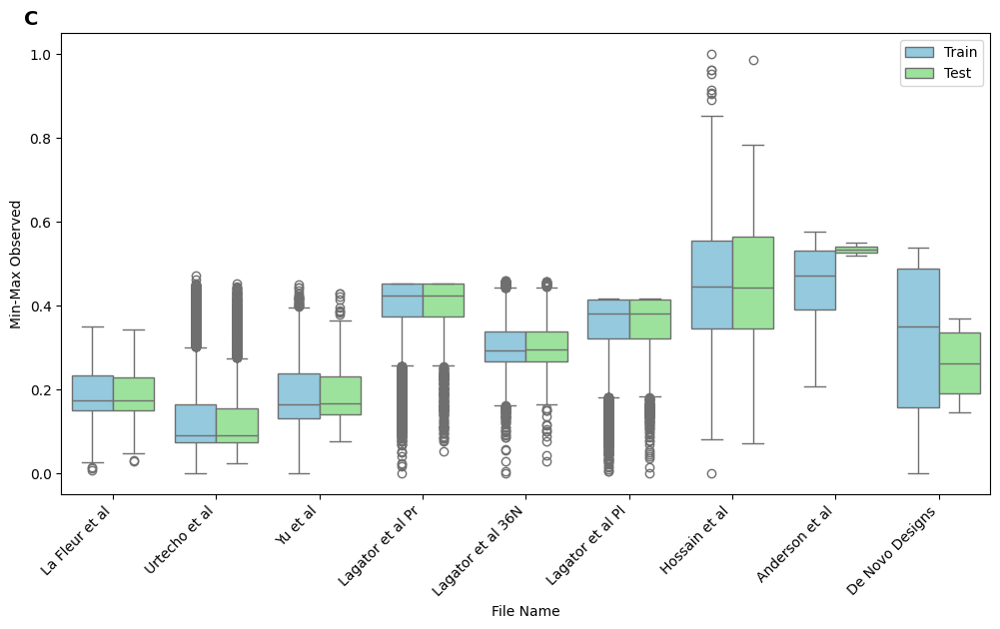

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

file_order = [
    'La Fleur et al', 'Urtecho et al', 'Yu et al', 'Lagator et al Pr',
    'Lagator et al 36N', 'Lagator et al Pl', 'Hossain et al',
    'Anderson et al', 'De Novo Designs'
]

# Load and process data
df = pd.read_csv('Data/LaFleur_supp.csv')
df['Min-Max Observed'] = MinMaxScaler().fit_transform(df[['Observed log(TX/Txref)']].abs())

# Split into train/test
indices = np.arange(len(df))
train_idx, test_idx = train_test_split(indices, test_size=0.2, random_state=42)
df['Split'] = 'Train'
df.loc[test_idx, 'Split'] = 'Test'

# Plot
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='File Name', y='Min-Max Observed', hue='Split', palette={'Train': 'skyblue', 'Test': 'lightgreen'}, order=file_order)

plt.xlabel('File Name')
plt.ylabel('Min-Max Observed')
plt.xticks(rotation=45, ha='right')
plt.legend()

plt.text(-0.025, 1.05, 'C', transform=plt.gca().transAxes,
         ha='right', va='top', fontsize=14, fontweight='bold')

# Save figure
plt.savefig('Figures/FigureS1C.pdf', dpi=300, bbox_inches='tight')
plt.show()


### Table S1
-----

In [16]:
import pandas as pd

df = pd.read_csv('Data/CNN_file_metrics.csv')[['File Name', 'Within-File Entropy', 'Within-File Hamming Distance']]
# df.to_csv('Figures/Table S1.csv', index=False)
df.head(None)

,File Name,Within-File Entropy,Within-File Hamming Distance
0,La Fleur et al,0.732649,25.173317
1,Urtecho et al,1.513936,86.719749
2,Yu et al,0.352242,21.625176
3,Lagator et al Pr,0.375852,16.272864
4,Lagator et al 36N,0.614703,26.777638
5,Lagator et al Pl,0.419147,19.612462
6,Hossain et al,1.799955,52.386382
7,Anderson et al,0.205827,3.580952
8,De Novo Designs,1.217053,60.679089


### Figure S3
-----

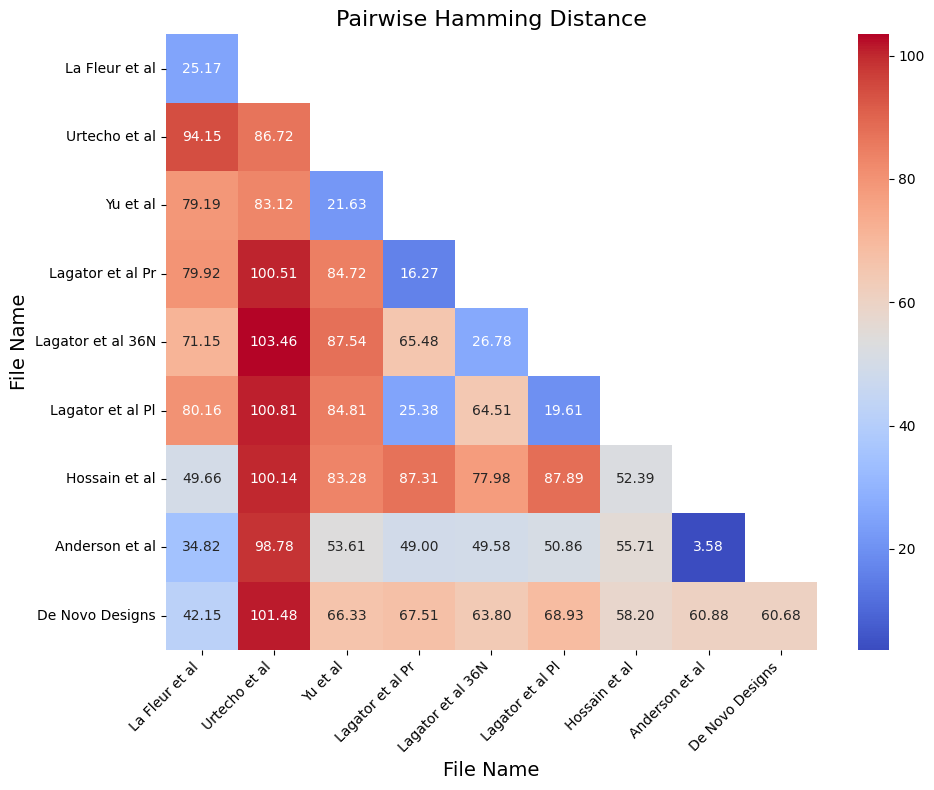

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

pairwise_distances = pd.read_csv('Data/pairwise_file_distance.csv', index_col=0)
mask = np.triu(np.ones(pairwise_distances.shape), k=1)

plt.figure(figsize=(10, 8))
sns.heatmap(pairwise_distances, 
            cmap='coolwarm', 
            annot=True, 
            fmt=".2f", 
            mask=mask, 
            xticklabels=pairwise_distances.columns, 
            yticklabels=pairwise_distances.index)

plt.title('Pairwise Hamming Distance', fontsize=16)
plt.xlabel('File Name', fontsize=14)
plt.ylabel('File Name', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Save the figure
# plt.savefig('Figures/Figure S3.pdf', dpi=300, bbox_inches='tight')